In [ ]:
# This dataset contains detailed records of electric vehicle (EV) charging sessions, including both technical charging 
# characteristics and contextual information about drivers, stations, and environmental conditions. Each row represents
# one charging session, and the variables describe battery levels before and after charging, energy consumed, charging 
# duration, charging cost, temperature, vehicle age, the location and charging station type, user type (commuter, casual,
# long-distance traveler), and time attributes such as time of day and day of week. In short, the data captures how EV 
# users behave, where they charge, how much energy they consume, and under what circumstances they plug in.
# Before applying any clustering models, I performed a complete and correct preprocessing pipeline. I started with
# exploratory data analysis (EDA) to visualize distributions, detect skewness, spot outliers, and understand general 
# charging behaviors. I will handle missing values, ensuring that charging duration, cost, and distance were clean and 
# consistent. I will transformed skewed variables such as duration, cost, and distance using logarithms to stabilize
# variance. To prepare categorical variables like vehicle model, station location, charger type, user type, time of day,
# and day of week, I will applly one-hot encoding. I also remove non-informative identifiers such as User ID and
# timestamps when training the models, while keeping them aside for later visualization and interpretation. Finally, I
# scaled all numeric columns to make sure variables with larger units (kWh, km, °C) don't dominate the clustering process.

# With this cleaned, transformed, and standardized dataset, I will apply PCA for dimensionality reduction and then
# train multiple clustering models—K-Means, GMM, DBSCAN, and Hierarchical Clustering—to uncover natural behavioral 
# segments among EV users. Through systematic parameter tuning, I will identify the best cluster structures and use them to
# interpret meaningful patterns in how different groups of drivers charge their vehicles.

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
df=pd.read_csv('ev_charging_patterns.csv')
df

,User ID,Vehicle Model,Battery Capacity (kWh),Charging Station ID,Charging Station Location,Charging Start Time,Charging End Time,Energy Consumed (kWh),Charging Duration (hours),Charging Rate (kW),Charging Cost (USD),Time of Day,Day of Week,State of Charge (Start %),State of Charge (End %),Distance Driven (since last charge) (km),Temperature (°C),Vehicle Age (years),Charger Type,User Type
0,User_1,BMW i3,108.463007,Station_391,Houston,2024-01-01 00:00:00,2024-01-01 00:39:00,60.712346,0.591363,36.389181,13.087717,Evening,Tuesday,29.371576,86.119962,293.602111,27.947953,2.0,DC Fast Charger,Commuter
1,User_2,Hyundai Kona,100.000000,Station_428,San Francisco,2024-01-01 01:00:00,2024-01-01 03:01:00,12.339275,3.133652,30.677735,21.128448,Morning,Monday,10.115778,84.664344,112.112804,14.311026,3.0,Level 1,Casual Driver
2,User_3,Chevy Bolt,75.000000,Station_181,San Francisco,2024-01-01 02:00:00,2024-01-01 04:48:00,19.128876,2.452653,27.513593,35.667270,Morning,Thursday,6.854604,69.917615,71.799253,21.002002,2.0,Level 2,Commuter
3,User_4,Hyundai Kona,50.000000,Station_327,Houston,2024-01-01 03:00:00,2024-01-01 06:42:00,79.457824,1.266431,32.882870,13.036239,Evening,Saturday,83.120003,99.624328,199.577785,38.316313,1.0,Level 1,Long-Distance Traveler
4,User_5,Hyundai Kona,50.000000,Station_108,Los Angeles,2024-01-01 04:00:00,2024-01-01 05:46:00,19.629104,2.019765,10.215712,10.161471,Morning,Saturday,54.258950,63.743786,203.661847,-7.834199,1.0,Level 1,Long-Distance Traveler
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1315,User_1316,Nissan Leaf,100.000000,Station_57,New York,2024-02-24 19:00:00,2024-02-24 20:30:00,42.011654,1.426444,5.895475,22.081164,Evening,Sunday,39.204102,83.915952,239.601075,1.919655,7.0,DC Fast Charger,Commuter
1316,User_1317,BMW i3,100.000000,Station_40,New York,2024-02-24 20:00:00,2024-02-24 20:44:00,68.185853,3.238212,18.388012,5.067806,Evening,Tuesday,31.456375,93.096461,164.376022,34.029775,4.0,Level 2,Casual Driver
1317,User_1318,Nissan Leaf,100.000000,Station_374,New York,2024-02-24 21:00:00,2024-02-24 23:03:00,18.895102,3.267122,45.482066,37.255002,Evening,Tuesday,71.903081,78.678879,226.519258,20.358761,5.0,DC Fast Charger,Commuter
1318,User_1319,Chevy Bolt,85.000000,Station_336,San Francisco,2024-02-24 22:00:00,2024-02-24 23:20:00,13.756252,2.754527,38.148183,39.046146,Afternoon,Sunday,76.187997,65.926573,291.494076,24.134598,5.0,Level 2,Commuter


In [2]:
df.columns

Index(['User ID', 'Vehicle Model', 'Battery Capacity (kWh)',
       'Charging Station ID', 'Charging Station Location',
       'Charging Start Time', 'Charging End Time', 'Energy Consumed (kWh)',
       'Charging Duration (hours)', 'Charging Rate (kW)',
       'Charging Cost (USD)', 'Time of Day', 'Day of Week',
       'State of Charge (Start %)', 'State of Charge (End %)',
       'Distance Driven (since last charge) (km)', 'Temperature (°C)',
       'Vehicle Age (years)', 'Charger Type', 'User Type'],
      dtype='object')

In [3]:
df['Charging Start Time'].max()

'2024-02-24 23:00:00'

In [4]:
df['Charging Start Time'].min()

'2024-01-01 00:00:00'

In [5]:
df.dtypes

User ID                                      object
Vehicle Model                                object
Battery Capacity (kWh)                      float64
Charging Station ID                          object
Charging Station Location                    object
Charging Start Time                          object
Charging End Time                            object
Energy Consumed (kWh)                       float64
Charging Duration (hours)                   float64
Charging Rate (kW)                          float64
Charging Cost (USD)                         float64
Time of Day                                  object
Day of Week                                  object
State of Charge (Start %)                   float64
State of Charge (End %)                     float64
Distance Driven (since last charge) (km)    float64
Temperature (°C)                            float64
Vehicle Age (years)                         float64
Charger Type                                 object
User Type   

In [6]:
df.describe()

,Battery Capacity (kWh),Energy Consumed (kWh),Charging Duration (hours),Charging Rate (kW),Charging Cost (USD),State of Charge (Start %),State of Charge (End %),Distance Driven (since last charge) (km),Temperature (°C),Vehicle Age (years)
count,1320.000000,1254.000000,1320.000000,1254.000000,1320.000000,1320.000000,1320.000000,1254.000000,1320.000000,1320.000000
mean,74.534692,42.642894,2.269377,25.963003,22.551352,49.130012,75.141590,153.596788,15.263591,3.612843
std,20.626914,22.411705,1.061037,14.011326,10.751494,24.074134,17.080580,86.004987,14.831216,2.309824
min,1.532807,0.045772,0.095314,1.472549,0.234317,2.325959,7.604224,0.862361,-10.724770,0.000000
25%,62.000000,23.881193,1.397623,13.856583,13.368141,27.786903,62.053266,79.445335,2.800664,2.000000
50%,75.000000,42.691405,2.258136,25.603799,22.076360,48.241771,75.682496,152.259867,14.630846,4.000000
75%,85.000000,61.206218,3.112806,37.502998,31.646044,69.277921,88.201370,226.073284,27.981810,6.000000
max,193.003074,152.238758,7.635145,97.342255,69.407743,152.489761,177.708666,398.364775,73.169588,11.688592


In [7]:
unique_times = df['Time of Day'].value_counts()

print("Number of unique Time of Day values:", df['Time of Day'].nunique())
print("\nObservations for each Time of Day category:")
print(unique_times)

Number of unique Time of Day values: 4

Observations for each Time of Day category:
Time of Day
Evening      362
Morning      336
Night        312
Afternoon    310
Name: count, dtype: int64


In [8]:
unique_week = df['Day of Week'].value_counts()

print(df['Time of Day'].nunique())
print("\nObservations for each Time of Day category:")
print(unique_week)

4

Observations for each Time of Day category:
Day of Week
Saturday     205
Tuesday      200
Wednesday    197
Sunday       191
Friday       188
Monday       185
Thursday     154
Name: count, dtype: int64


In [9]:
Vehicle_Model = df['Vehicle Model'].value_counts()
Vehicle_Model

Vehicle Model
Tesla Model 3    280
Hyundai Kona     266
Nissan Leaf      260
BMW i3           258
Chevy Bolt       256
Name: count, dtype: int64

In [10]:
Charging_Station_Location = df['Charging Station Location'].value_counts()
Charging_Station_Location

Charging Station Location
Los Angeles      297
San Francisco    264
Houston          262
New York         255
Chicago          242
Name: count, dtype: int64

In [11]:
Charger_Type = df['Charger Type'].value_counts()
Charger_Type

Charger Type
Level 1            459
Level 2            431
DC Fast Charger    430
Name: count, dtype: int64

In [12]:
User_Type = df['User Type'].value_counts()
User_Type

User Type
Commuter                  476
Long-Distance Traveler    437
Casual Driver             407
Name: count, dtype: int64

In [13]:
# price per kWh first

avg_price_by_location = (
    (df["Charging Cost (USD)"] / df["Energy Consumed (kWh)"])
    .groupby(df["Charging Station Location"])
    .mean()
    .round(3)
)


avg_price_by_location

Charging Station Location
Chicago          2.206
Houston          0.803
Los Angeles      3.373
New York         0.869
San Francisco    0.870
dtype: float64

In [14]:
data=df.copy()

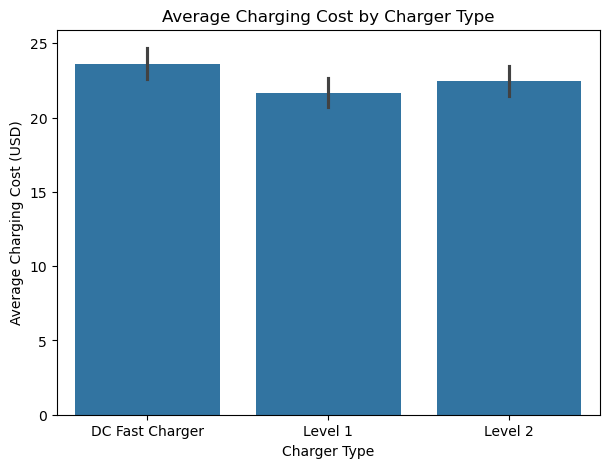

In [15]:
# average charging cost by charger type
plt.figure(figsize=(7,5))
sns.barplot(x='Charger Type', y='Charging Cost (USD)', data=data, estimator='mean')

plt.title('Average Charging Cost by Charger Type')
plt.xlabel('Charger Type')
plt.ylabel('Average Charging Cost (USD)')
plt.show()

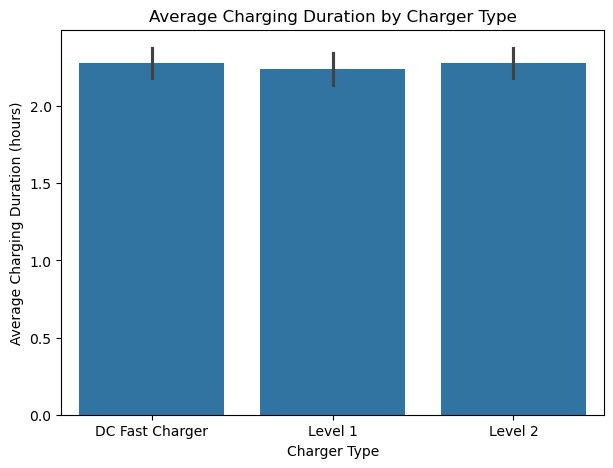

In [16]:
plt.figure(figsize=(7,5))
sns.barplot(x='Charger Type', y='Charging Duration (hours)', data=data, estimator='mean')

plt.title('Average Charging Duration by Charger Type')
plt.xlabel('Charger Type')
plt.ylabel('Average Charging Duration (hours)')
plt.show()

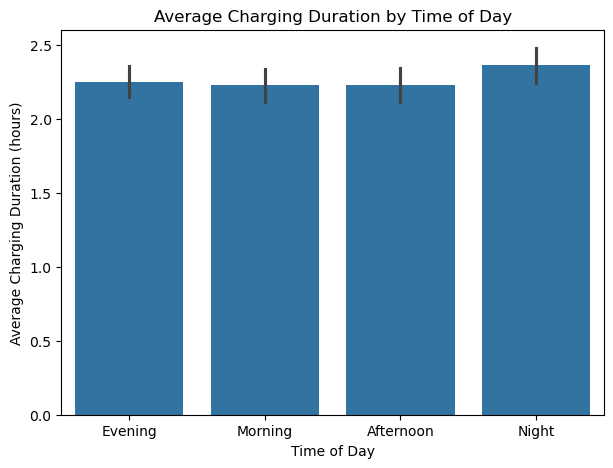

In [17]:
#  average charging duration by time of day
plt.figure(figsize=(7,5))
sns.barplot(x='Time of Day', y='Charging Duration (hours)', data=data, estimator='mean')

plt.title('Average Charging Duration by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Average Charging Duration (hours)')
plt.show()

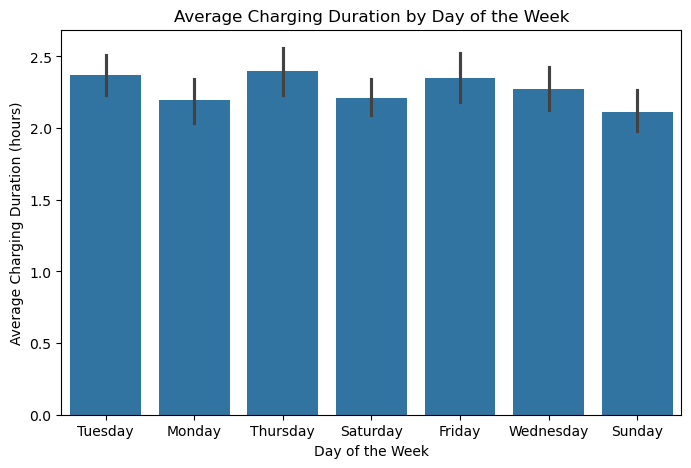

In [18]:
#  average charging duration by day of the week
plt.figure(figsize=(8,5))
sns.barplot(x='Day of Week', y='Charging Duration (hours)', data=data, estimator='mean')

plt.title('Average Charging Duration by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Average Charging Duration (hours)')
plt.show()

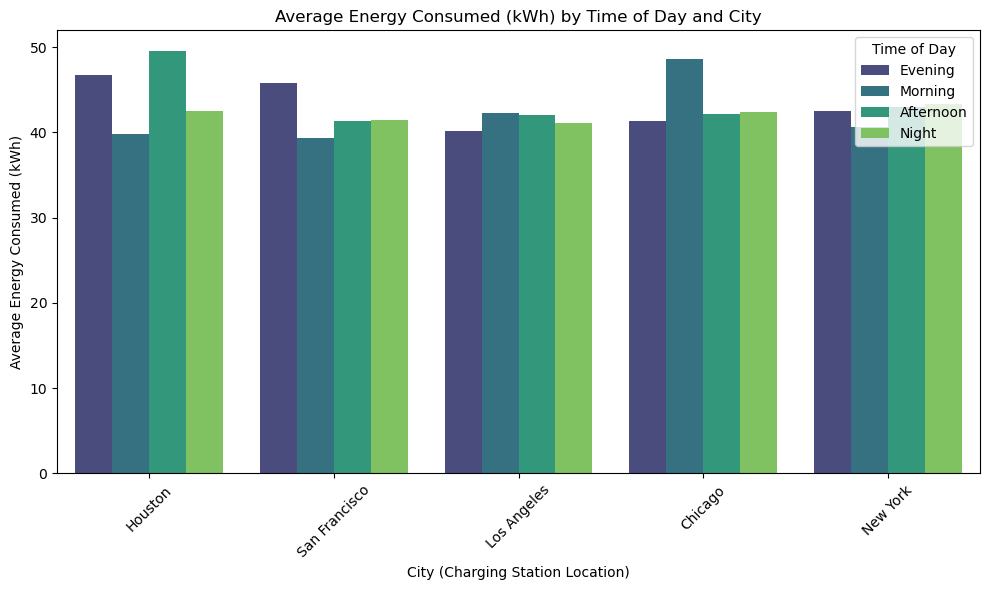

In [19]:
plt.figure(figsize=(10,6))
sns.barplot(
    x='Charging Station Location',
    y='Energy Consumed (kWh)',
    hue='Time of Day',
    data=data,
    estimator='mean',
    errorbar=None,        
    palette='viridis'
)

plt.title('Average Energy Consumed (kWh) by Time of Day and City')
plt.xlabel('City (Charging Station Location)')
plt.ylabel('Average Energy Consumed (kWh)')
plt.legend(title='Time of Day')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

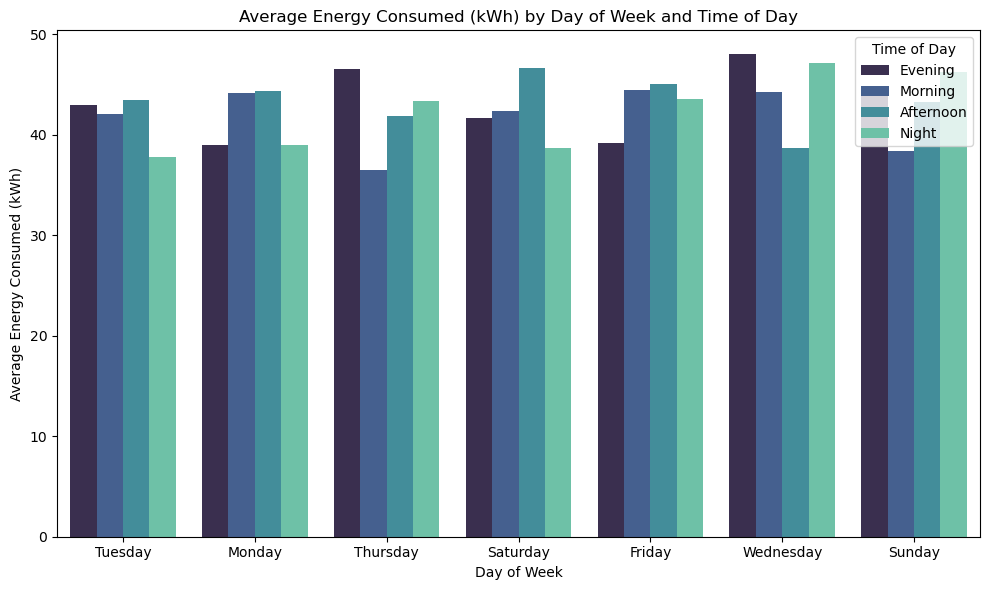

In [20]:
plt.figure(figsize=(10,6))
sns.barplot(
    x='Day of Week',
    y='Energy Consumed (kWh)',
    hue='Time of Day',
    data=data,
    estimator='mean',
    errorbar=None,          
    palette='mako'
)

plt.title('Average Energy Consumed (kWh) by Day of Week and Time of Day')
plt.xlabel('Day of Week')
plt.ylabel('Average Energy Consumed (kWh)')
plt.legend(title='Time of Day')
plt.tight_layout()
plt.show()

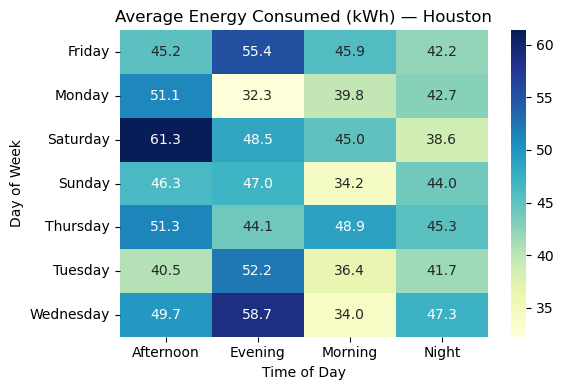

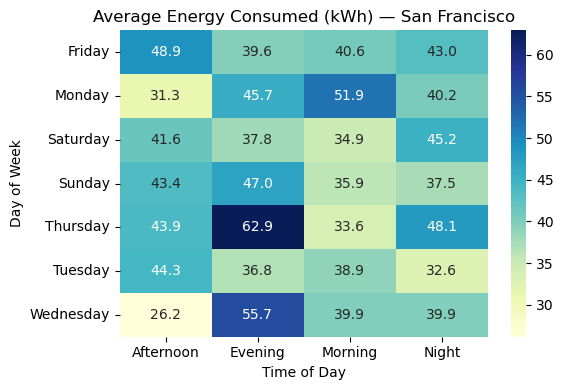

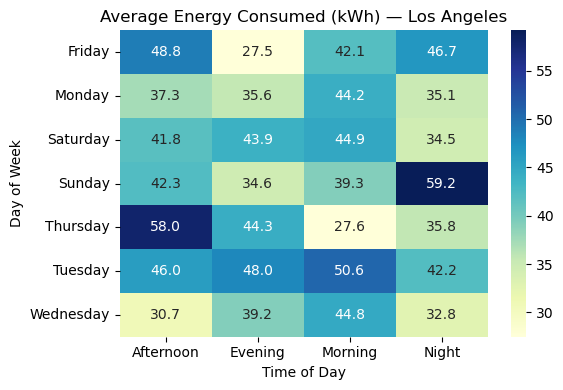

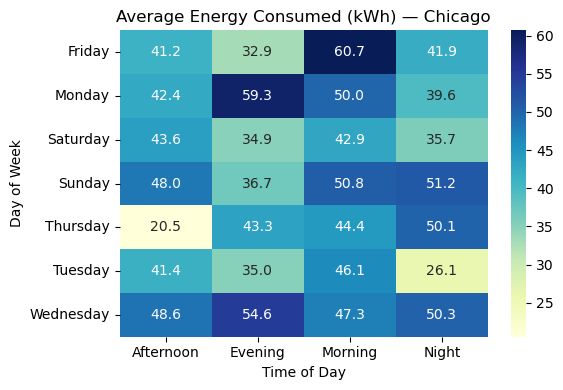

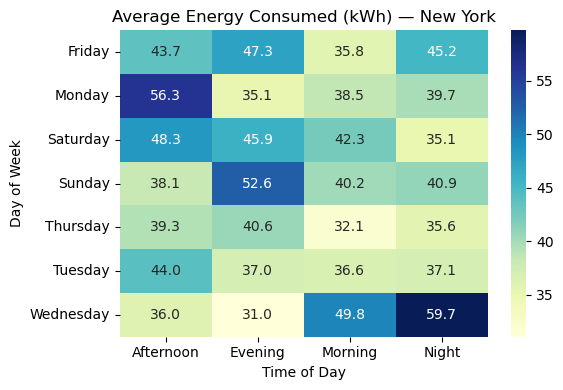

In [21]:
for city in data['Charging Station Location'].unique():
    subset = data[data['Charging Station Location'] == city]
    pivot = subset.pivot_table(
        index='Day of Week',
        columns='Time of Day',
        values='Energy Consumed (kWh)',
        aggfunc='mean'
    )

    plt.figure(figsize=(6,4))
    sns.heatmap(pivot, annot=True, fmt=".1f", cmap='YlGnBu')
    plt.title(f'Average Energy Consumed (kWh) — {city}')
    plt.xlabel('Time of Day')
    plt.ylabel('Day of Week')
    plt.tight_layout()
    plt.show()

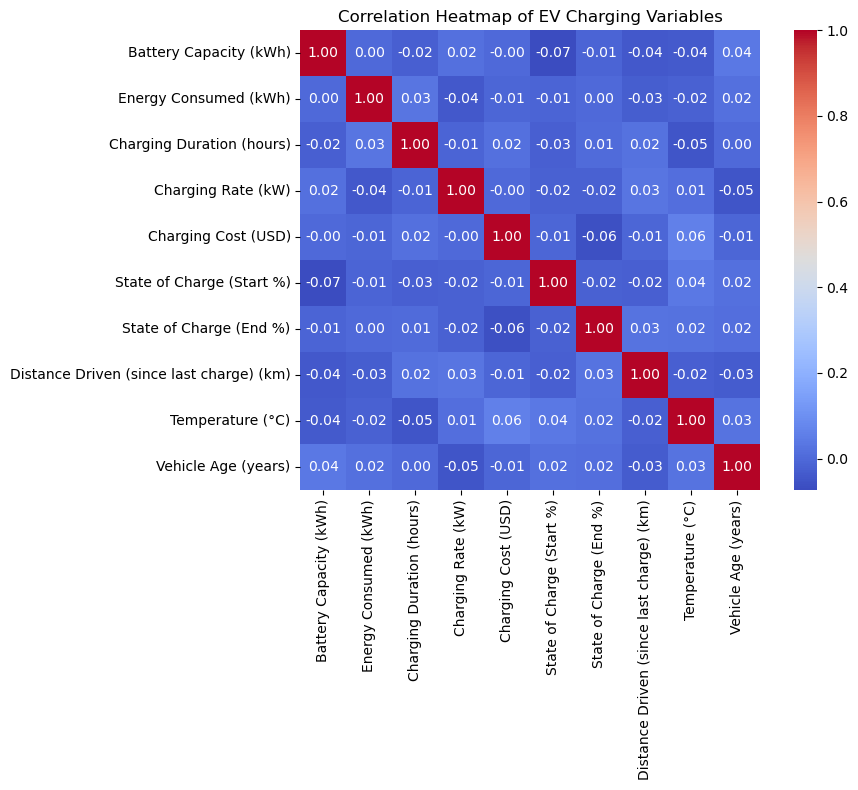

In [22]:
cols = [
    'Battery Capacity (kWh)',
    'Energy Consumed (kWh)',
    'Charging Duration (hours)',
    'Charging Rate (kW)',
    'Charging Cost (USD)',
    'State of Charge (Start %)',
    'State of Charge (End %)',
    'Distance Driven (since last charge) (km)',
    'Temperature (°C)',
    'Vehicle Age (years)'
]

# correlation matrix
corr = data[cols].corr()

plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title('Correlation Heatmap of EV Charging Variables')
plt.tight_layout()
plt.show()

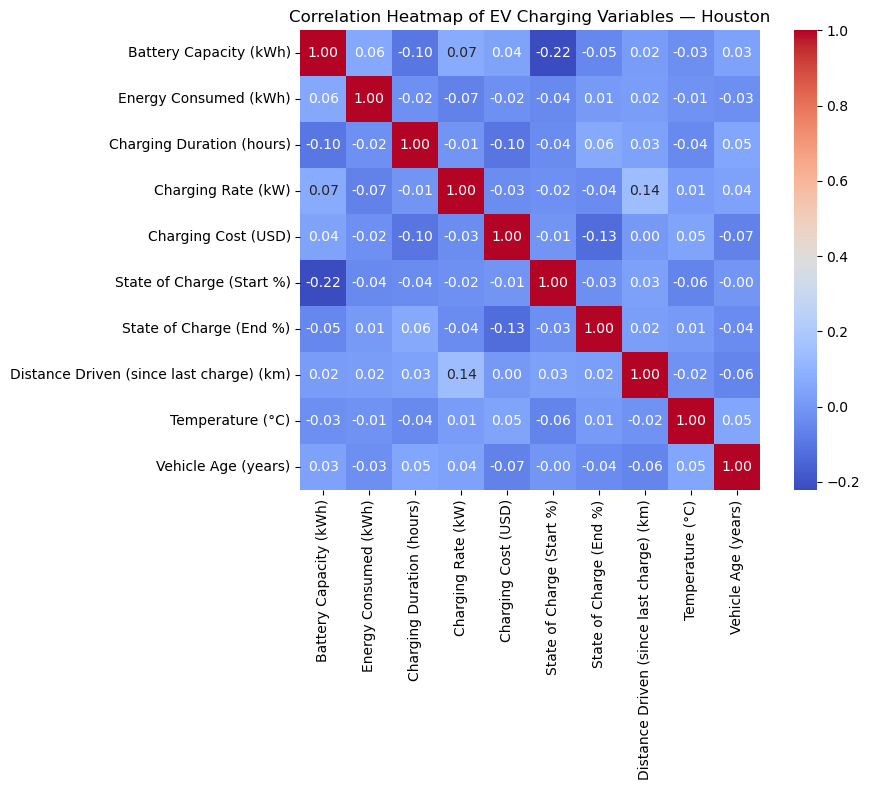

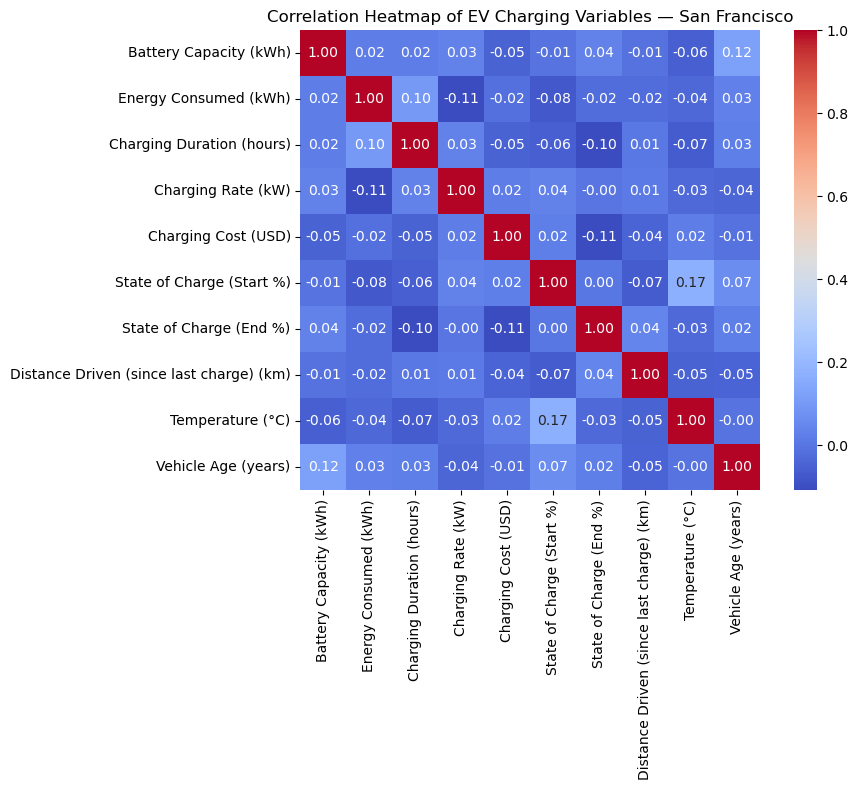

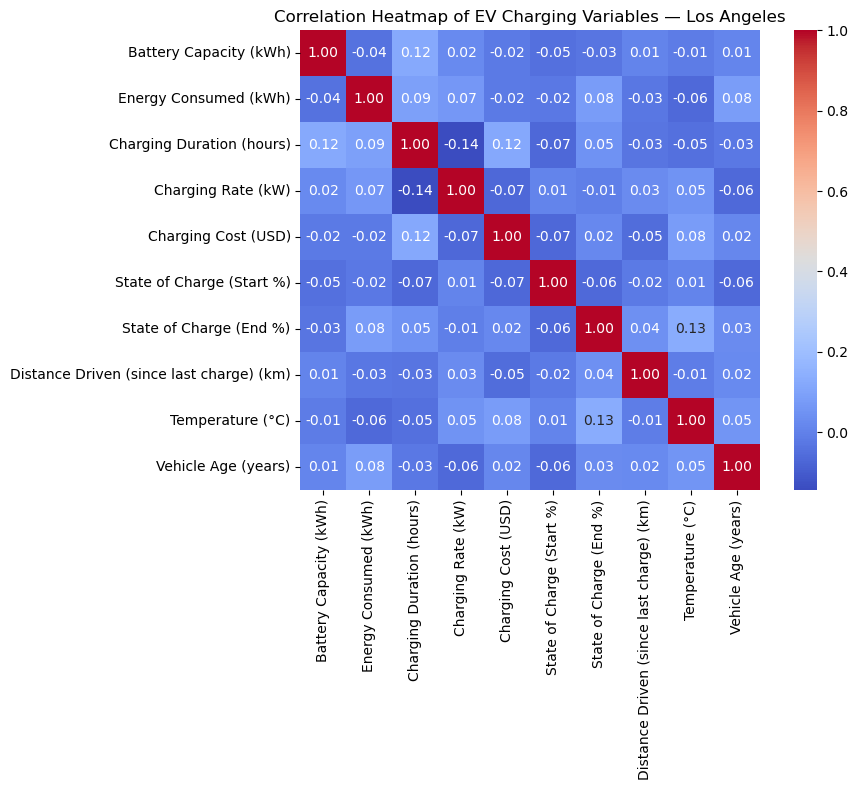

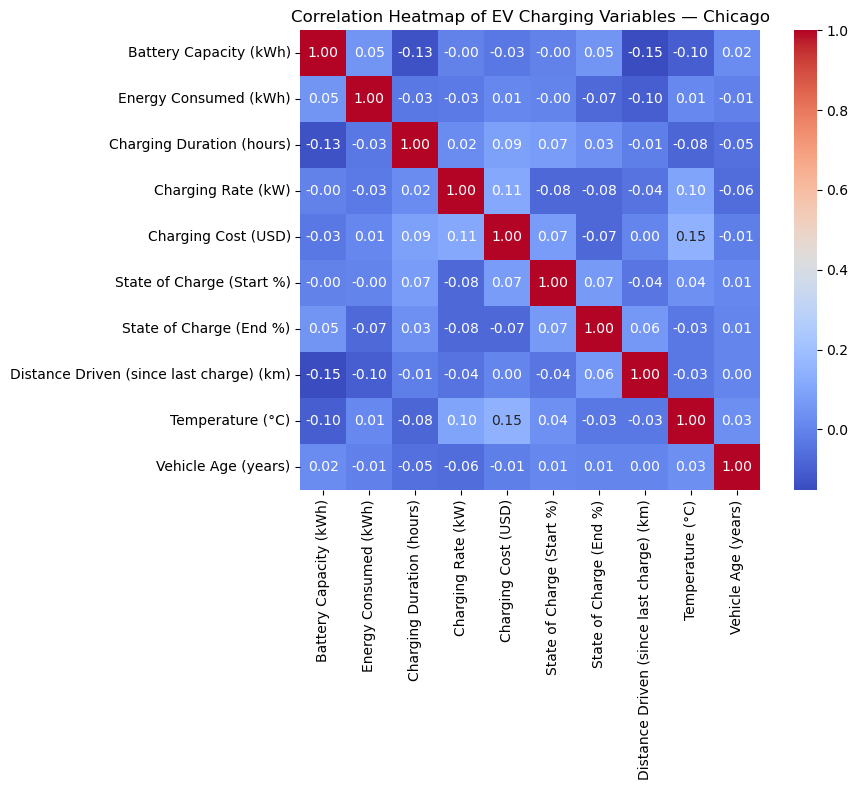

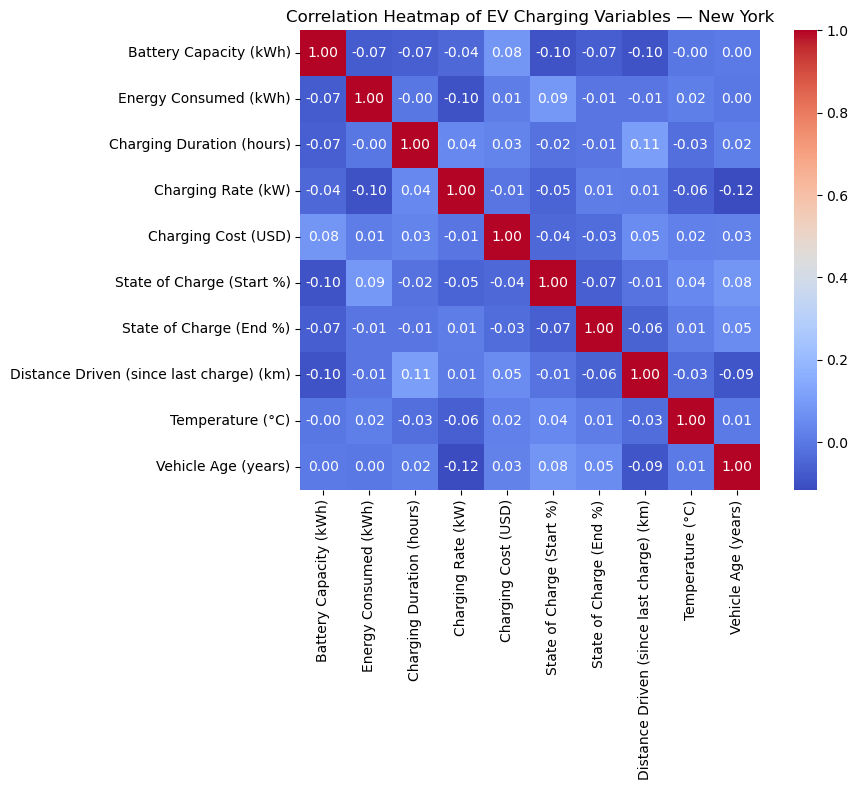

In [23]:
# List of numeric columns to include
cols = [
    'Battery Capacity (kWh)',
    'Energy Consumed (kWh)',
    'Charging Duration (hours)',
    'Charging Rate (kW)',
    'Charging Cost (USD)',
    'State of Charge (Start %)',
    'State of Charge (End %)',
    'Distance Driven (since last charge) (km)',
    'Temperature (°C)',
    'Vehicle Age (years)'
]


for city in data['Charging Station Location'].unique():
    city_data = data[data['Charging Station Location'] == city]
    corr = city_data[cols].corr()

    plt.figure(figsize=(10,8))
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", square=True)
    plt.title(f'Correlation Heatmap of EV Charging Variables — {city}')
    plt.tight_layout()
    plt.show()

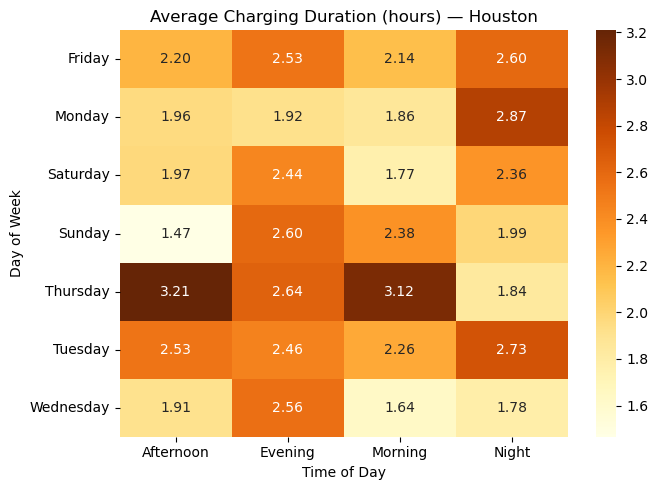

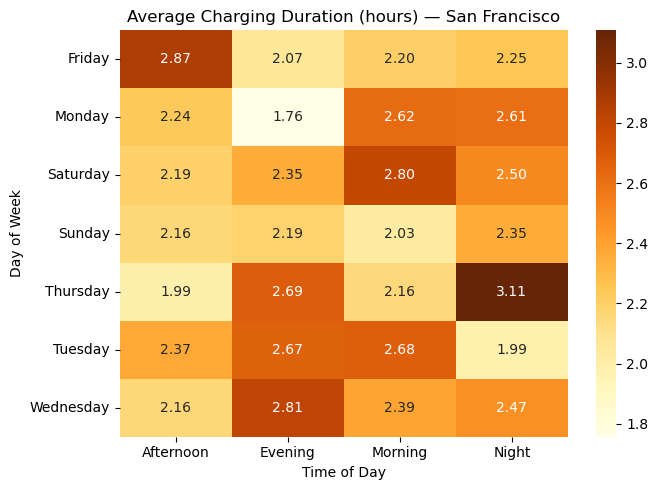

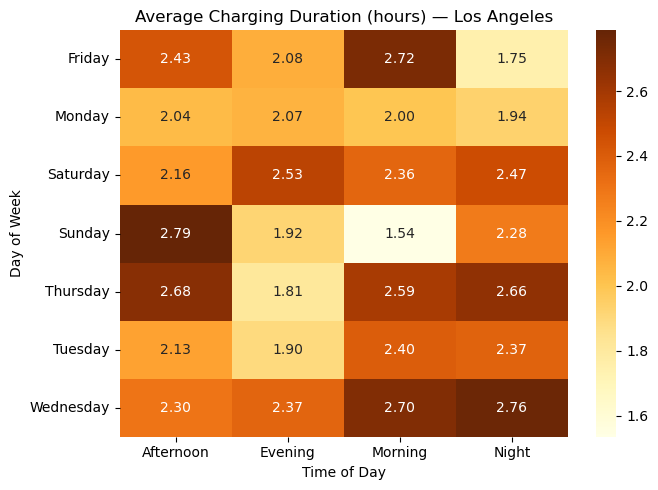

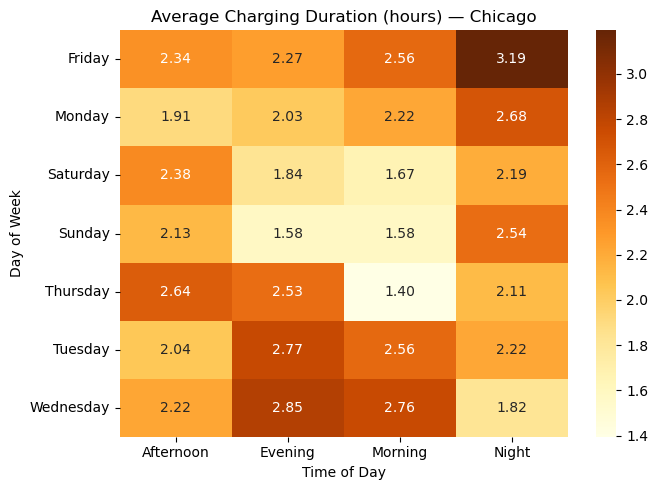

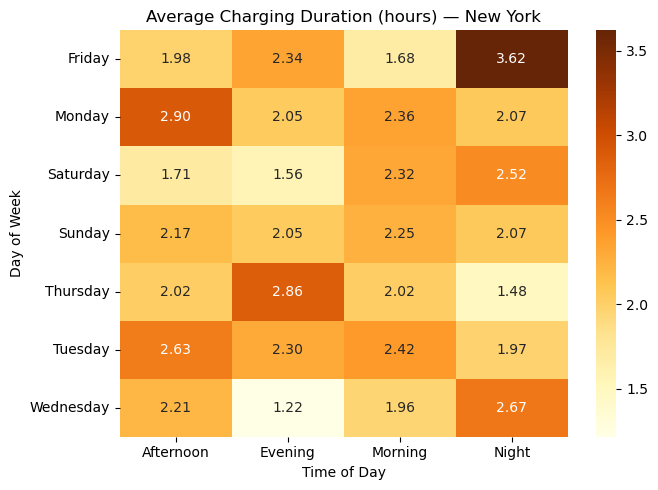

In [24]:
for city in data['Charging Station Location'].unique():
    subset = data[data['Charging Station Location'] == city]
    
    
    pivot = subset.pivot_table(
        index='Day of Week',
        columns='Time of Day',
        values='Charging Duration (hours)',
        aggfunc='mean'
    )

    
    plt.figure(figsize=(7,5))
    sns.heatmap(pivot, annot=True, fmt=".2f", cmap='YlOrBr')
    plt.title(f'Average Charging Duration (hours) — {city}')
    plt.xlabel('Time of Day')
    plt.ylabel('Day of Week')
    plt.tight_layout()
    plt.show()

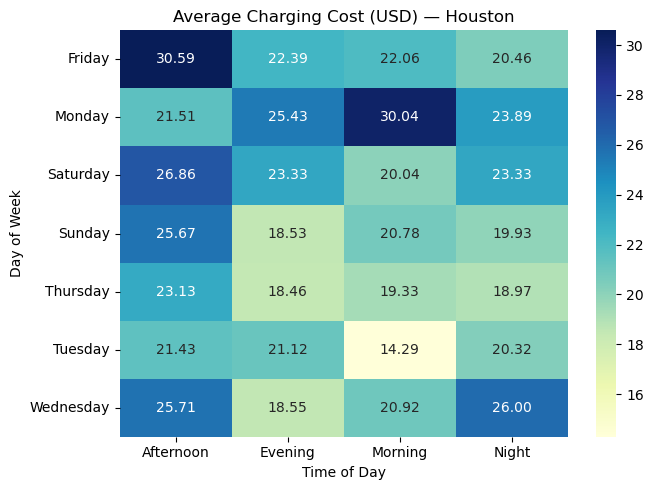

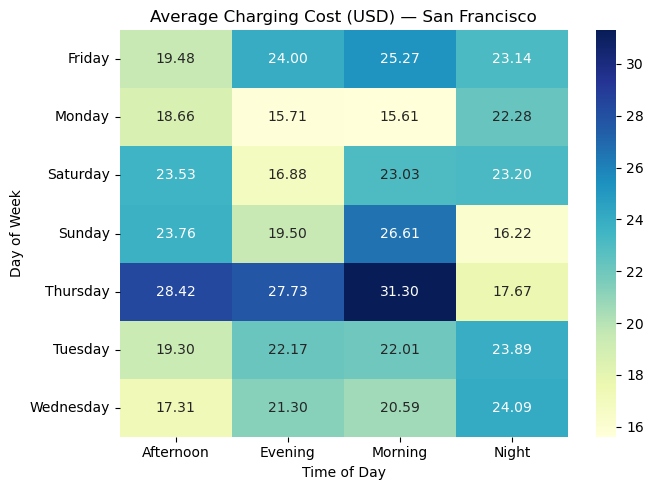

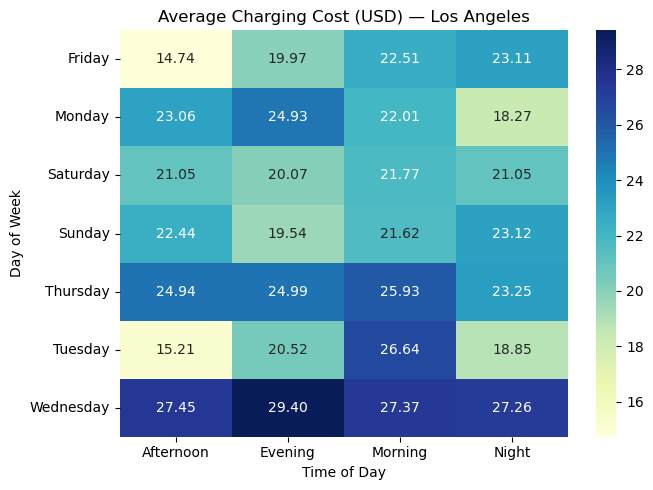

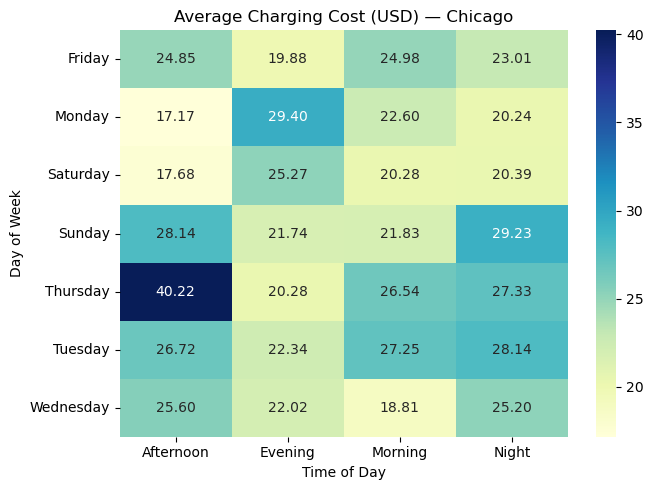

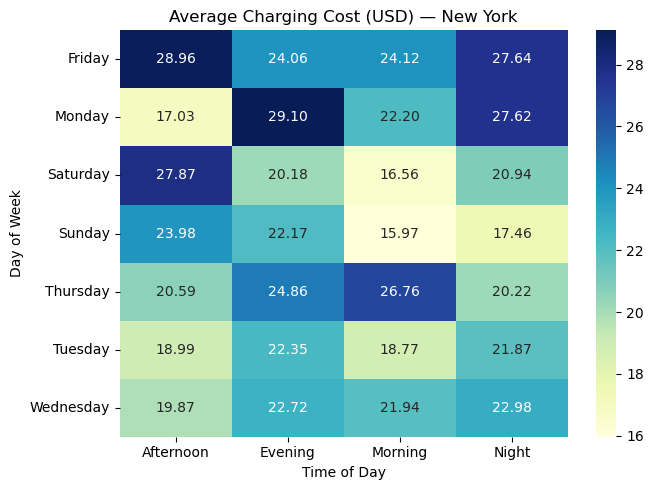

In [25]:
for city in data['Charging Station Location'].unique():
    subset = data[data['Charging Station Location'] == city]
    
    pivot = subset.pivot_table(
        index='Day of Week',
        columns='Time of Day',
        values='Charging Cost (USD)',
        aggfunc='mean'
    )

    plt.figure(figsize=(7,5))
    sns.heatmap(pivot, annot=True, fmt=".2f", cmap='YlGnBu')
    plt.title(f'Average Charging Cost (USD) — {city}')
    plt.xlabel('Time of Day')
    plt.ylabel('Day of Week')
    plt.tight_layout()
    plt.show()

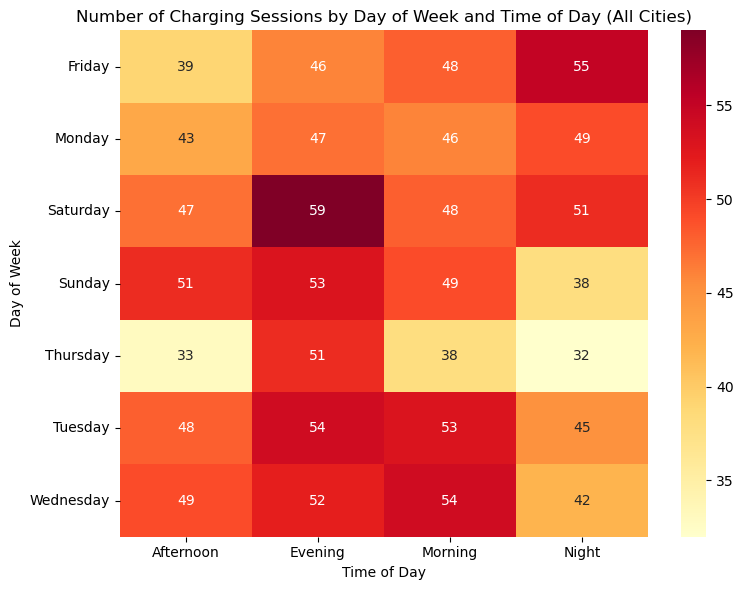

In [26]:
pivot = data.pivot_table(
    index='Day of Week',
    columns='Time of Day',
    values='Charging Station Location',
    aggfunc='count'
)

# Total charging sessions by day & time for all cities
plt.figure(figsize=(8,6))
sns.heatmap(pivot, annot=True, fmt=".0f", cmap='YlOrRd')
plt.title('Number of Charging Sessions by Day of Week and Time of Day (All Cities)')
plt.xlabel('Time of Day')
plt.ylabel('Day of Week')
plt.tight_layout()
plt.show()

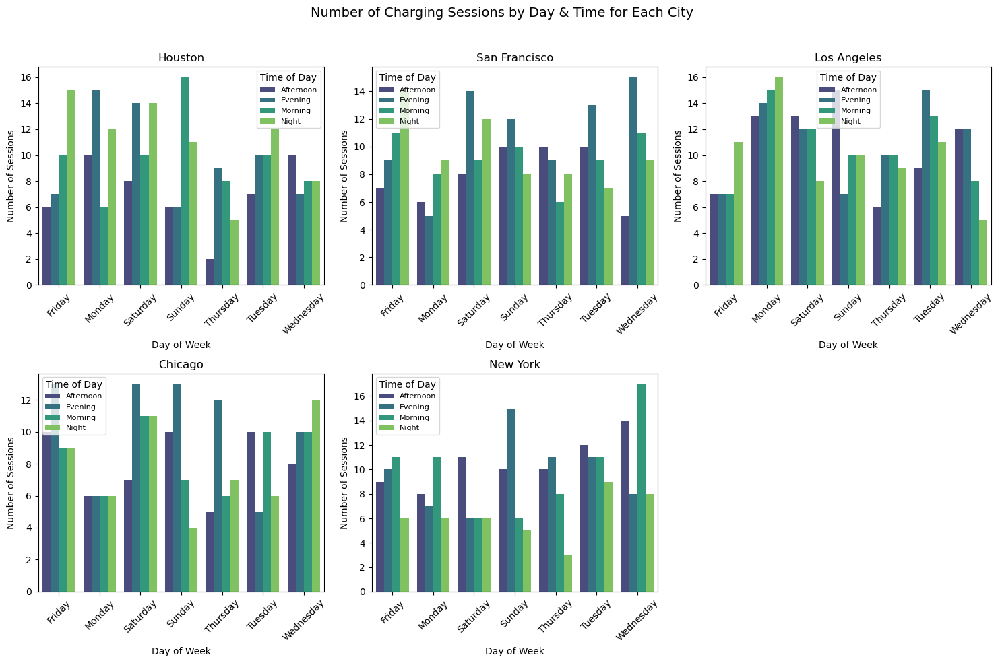

In [27]:
cities = data['Charging Station Location'].unique()

plt.figure(figsize=(15,10))

for i, city in enumerate(cities, 1):
    plt.subplot(2, 3, i) 
    subset = data[data['Charging Station Location'] == city]
    

    counts = subset.groupby(['Day of Week', 'Time of Day']).size().reset_index(name='Count')
    
    
    sns.barplot(
        x='Day of Week',
        y='Count',
        hue='Time of Day',
        data=counts,
        palette='viridis',
        errorbar=None
    )
    
    plt.title(f'{city}')
    plt.xlabel('Day of Week')
    plt.ylabel('Number of Sessions')
    plt.xticks(rotation=45)
    plt.legend(title='Time of Day', fontsize=8)

plt.suptitle('Number of Charging Sessions by Day & Time for Each City', fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

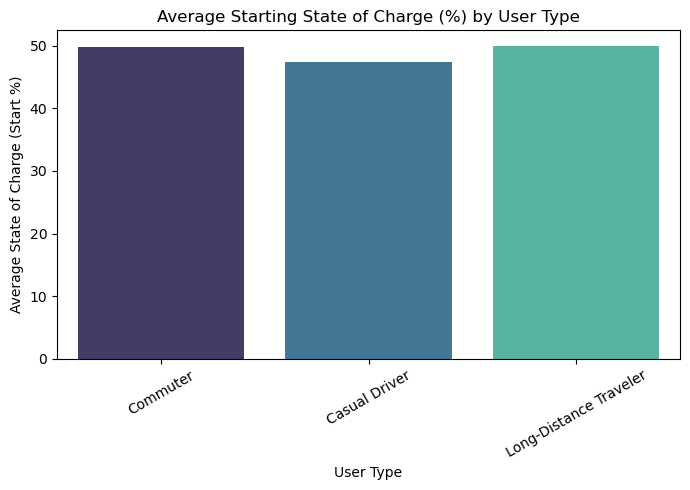

In [28]:
plt.figure(figsize=(7,5))
sns.barplot(
    x='User Type',
    y='State of Charge (Start %)',
    hue='User Type',
    data=data,
    estimator='mean',
    errorbar=None,
    palette='mako'
)

plt.title('Average Starting State of Charge (%) by User Type')
plt.xlabel('User Type')
plt.ylabel('Average State of Charge (Start %)')
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

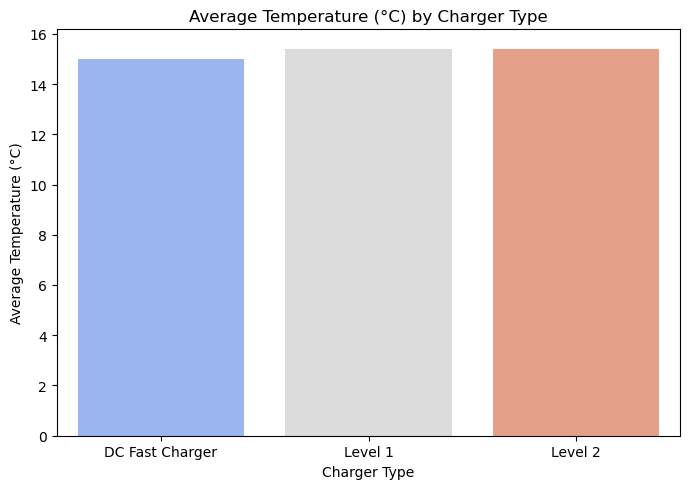

In [29]:
plt.figure(figsize=(7,5))
sns.barplot(
    x='Charger Type',
    y='Temperature (°C)',
    hue='Charger Type',
    data=data,
    estimator='mean',
    errorbar=None,
    palette='coolwarm'
)

plt.title('Average Temperature (°C) by Charger Type')
plt.xlabel('Charger Type')
plt.ylabel('Average Temperature (°C)')
plt.tight_layout()
plt.show()

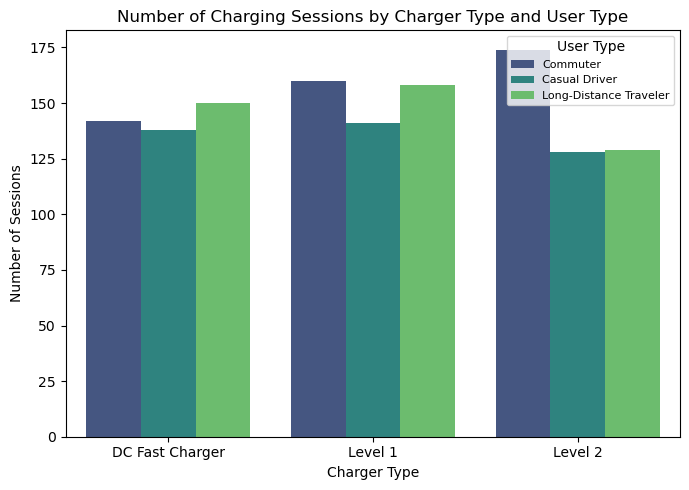

In [30]:
plt.figure(figsize=(7,5))
sns.countplot(
    x='Charger Type',
    hue='User Type',
    data=data,
    palette='viridis'
)

plt.title('Number of Charging Sessions by Charger Type and User Type')
plt.xlabel('Charger Type')
plt.ylabel('Number of Sessions')
plt.legend(title='User Type', fontsize=8)
plt.tight_layout()
plt.show()

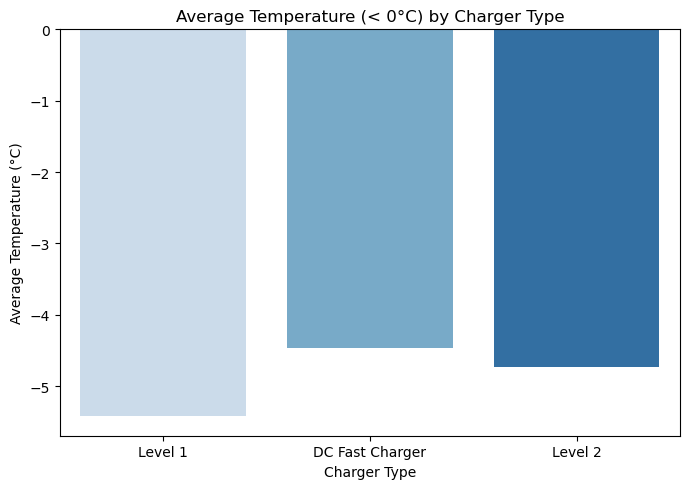

In [31]:
# Filtering data for temperatures below 0°C
cold_data = data[data['Temperature (°C)'] < 0]

plt.figure(figsize=(7,5))
sns.barplot(
    x='Charger Type',
    y='Temperature (°C)',
    hue='Charger Type',
    data=cold_data,
    estimator='mean',
    errorbar=None,
    palette='Blues'
)

plt.title('Average Temperature (< 0°C) by Charger Type')
plt.xlabel('Charger Type')
plt.ylabel('Average Temperature (°C)')
plt.tight_layout()
plt.show()

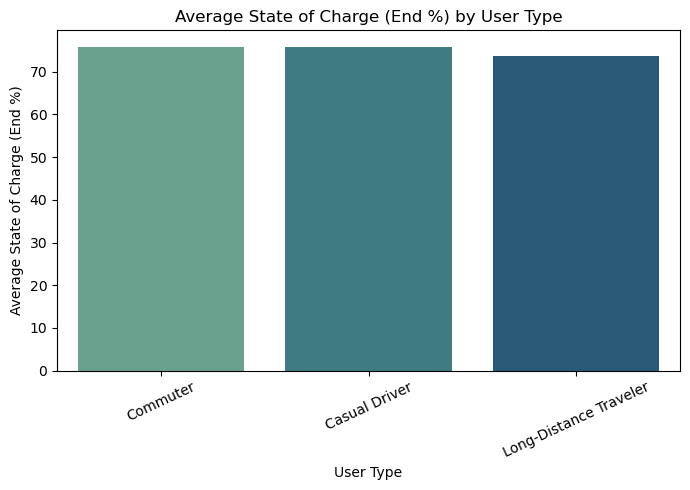

In [32]:
plt.figure(figsize=(7,5))
sns.barplot(
    x='User Type',
    y='State of Charge (End %)',
    hue='User Type',  
    data=data,
    estimator='mean',
    errorbar=None,
    palette='crest'
)

plt.title('Average State of Charge (End %) by User Type')
plt.xlabel('User Type')
plt.ylabel('Average State of Charge (End %)')
plt.xticks(rotation=25)
plt.tight_layout()
plt.show()

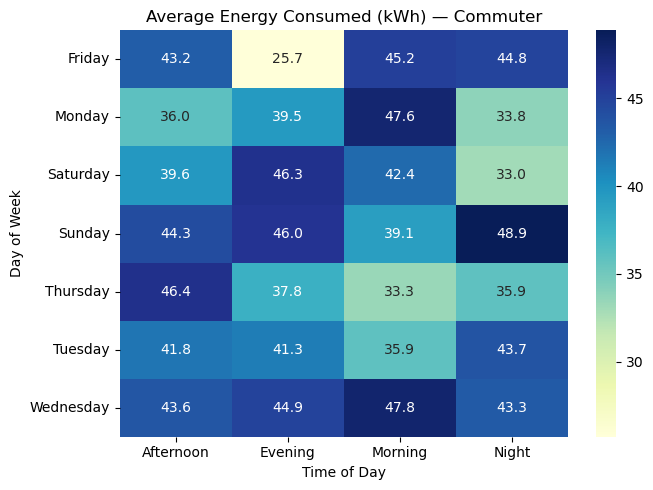

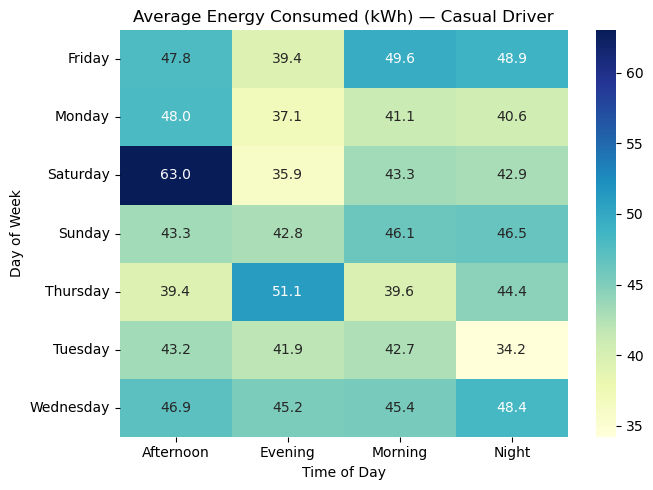

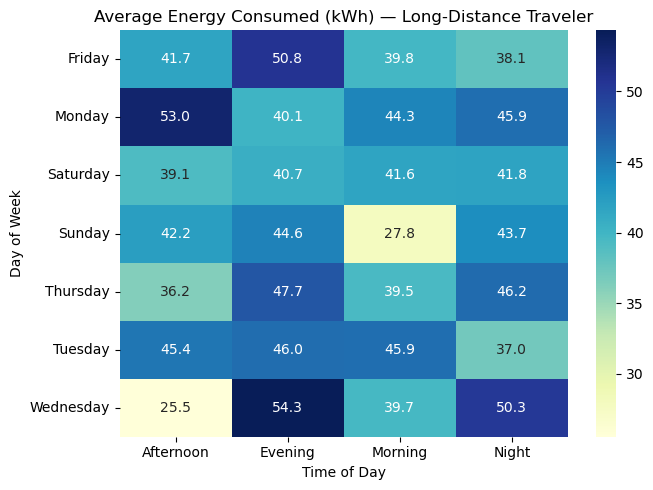

In [34]:

for user in data['User Type'].unique():
    subset = data[data['User Type'] == user]
    
    
    pivot = subset.pivot_table(
        index='Day of Week',
        columns='Time of Day',
        values='Energy Consumed (kWh)',
        aggfunc='mean'
    )
    
    
    plt.figure(figsize=(7,5))
    sns.heatmap(pivot, annot=True, fmt=".1f", cmap='YlGnBu')
    plt.title(f'Average Energy Consumed (kWh) — {user}')
    plt.xlabel('Time of Day')
    plt.ylabel('Day of Week')
    plt.tight_layout()
    plt.show()

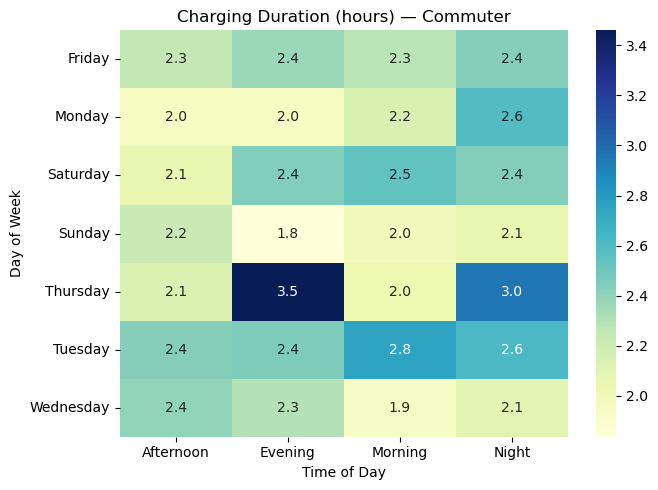

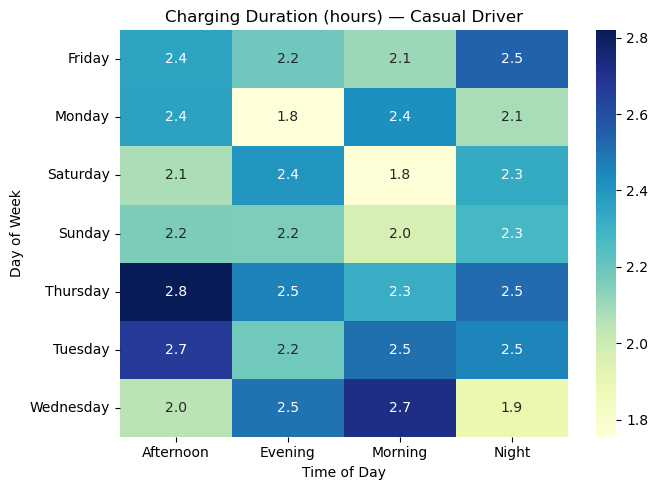

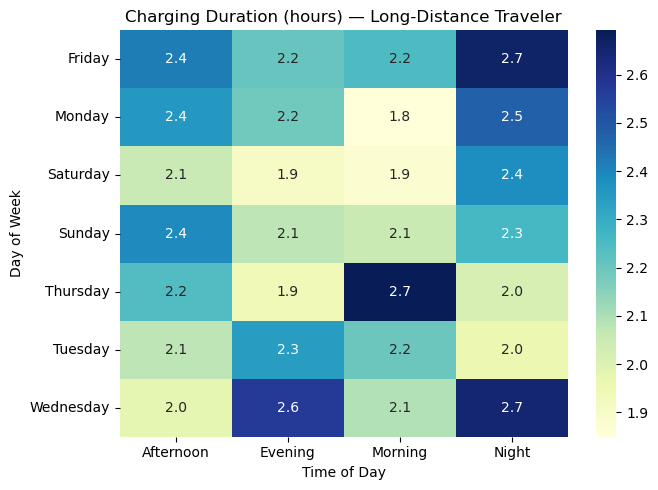

In [35]:

for user in data['User Type'].unique():
    subset = data[data['User Type'] == user]
    
    
    pivot = subset.pivot_table(
        index='Day of Week',
        columns='Time of Day',
        values='Charging Duration (hours)',
        aggfunc='mean'
    )
    
    
    plt.figure(figsize=(7,5))
    sns.heatmap(pivot, annot=True, fmt=".1f", cmap='YlGnBu')
    plt.title(f'Charging Duration (hours) — {user}')
    plt.xlabel('Time of Day')
    plt.ylabel('Day of Week')
    plt.tight_layout()
    plt.show()

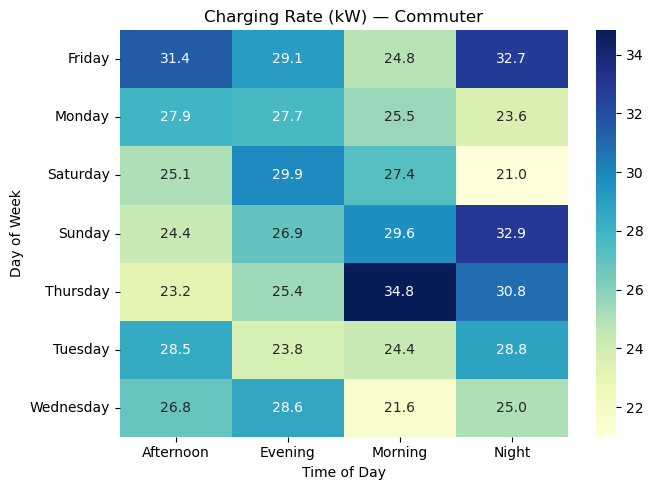

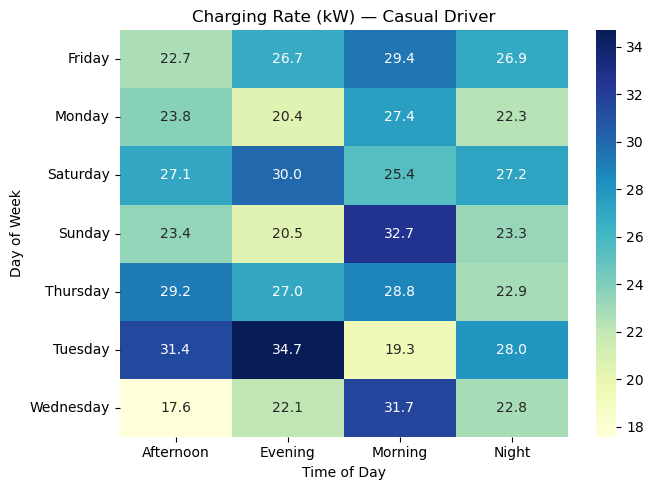

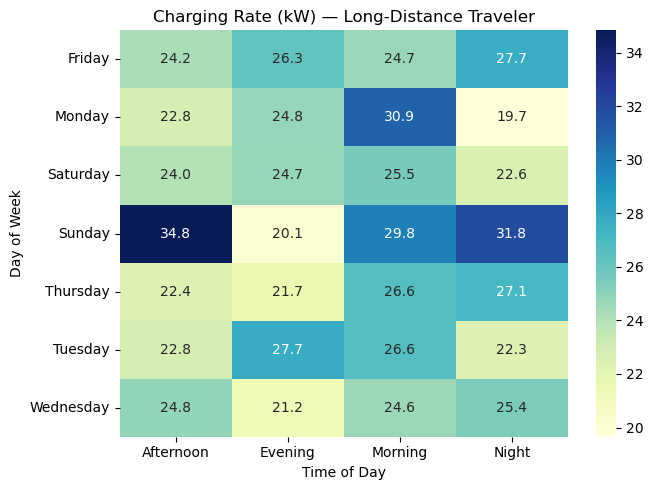

In [36]:
for user in data['User Type'].unique():
    subset = data[data['User Type'] == user]
    
   
    pivot = subset.pivot_table(
        index='Day of Week',
        columns='Time of Day',
        values='Charging Rate (kW)',
        aggfunc='mean'
    )
    
    
    plt.figure(figsize=(7,5))
    sns.heatmap(pivot, annot=True, fmt=".1f", cmap='YlGnBu')
    plt.title(f'Charging Rate (kW) — {user}')
    plt.xlabel('Time of Day')
    plt.ylabel('Day of Week')
    plt.tight_layout()
    plt.show()

In [37]:
data.isnull().sum()

User ID                                      0
Vehicle Model                                0
Battery Capacity (kWh)                       0
Charging Station ID                          0
Charging Station Location                    0
Charging Start Time                          0
Charging End Time                            0
Energy Consumed (kWh)                       66
Charging Duration (hours)                    0
Charging Rate (kW)                          66
Charging Cost (USD)                          0
Time of Day                                  0
Day of Week                                  0
State of Charge (Start %)                    0
State of Charge (End %)                      0
Distance Driven (since last charge) (km)    66
Temperature (°C)                             0
Vehicle Age (years)                          0
Charger Type                                 0
User Type                                    0
dtype: int64

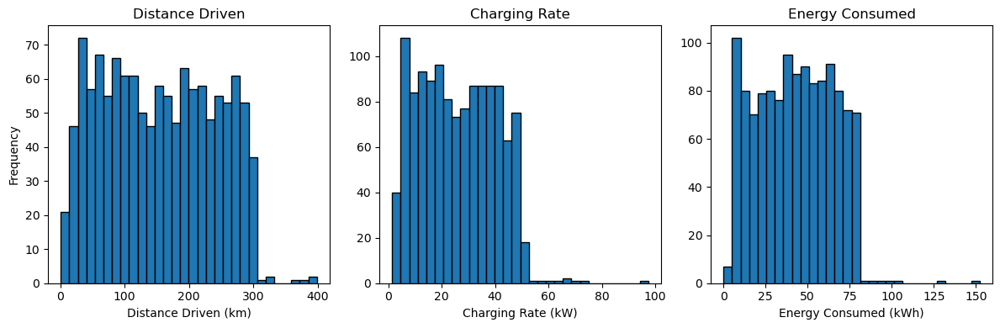

In [38]:
plt.figure(figsize=(12, 4))

# Distance Driven
plt.subplot(1, 3, 1)
plt.hist(data['Distance Driven (since last charge) (km)'], bins=30, edgecolor='black')
plt.xlabel('Distance Driven (km)')
plt.ylabel('Frequency')
plt.title('Distance Driven')

# Charging Rate
plt.subplot(1, 3, 2)
plt.hist(data['Charging Rate (kW)'], bins=30, edgecolor='black')
plt.xlabel('Charging Rate (kW)')
plt.title('Charging Rate')

# Energy Consumed
plt.subplot(1, 3, 3)
plt.hist(data['Energy Consumed (kWh)'], bins=30, edgecolor='black')
plt.xlabel('Energy Consumed (kWh)')
plt.title('Energy Consumed')

plt.tight_layout()
plt.show()

In [39]:
# Imputing Energy Consumed (kWh): Energy Consumed=Battery Capacity (kWh)×(SOC End−SOC Start)/100
data['Energy Consumed (kWh)'] = data.apply(
    lambda row: row['Battery Capacity (kWh)'] * 
                (row['State of Charge (End %)'] - row['State of Charge (Start %)']) / 100
                if pd.isna(row['Energy Consumed (kWh)']) else row['Energy Consumed (kWh)'],
    axis=1
)


In [40]:
# Imputing Distance Driven (km) (Using KNN Imputer)


from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=5)

data['Distance Driven (since last charge) (km)'] = imputer.fit_transform(
    data[['Distance Driven (since last charge) (km)']]
)


In [41]:
# Filling only missing values for Charging Rate
data.loc[data['Charging Rate (kW)'].isna(), 'Charging Rate (kW)'] = ( #Go to the rows where Charging Rate (kW) is missing, and select that column only.
    data['Energy Consumed (kWh)'] / data['Charging Duration (hours)']
)

In [42]:
data.isnull().sum()

User ID                                     0
Vehicle Model                               0
Battery Capacity (kWh)                      0
Charging Station ID                         0
Charging Station Location                   0
Charging Start Time                         0
Charging End Time                           0
Energy Consumed (kWh)                       0
Charging Duration (hours)                   0
Charging Rate (kW)                          0
Charging Cost (USD)                         0
Time of Day                                 0
Day of Week                                 0
State of Charge (Start %)                   0
State of Charge (End %)                     0
Distance Driven (since last charge) (km)    0
Temperature (°C)                            0
Vehicle Age (years)                         0
Charger Type                                0
User Type                                   0
dtype: int64

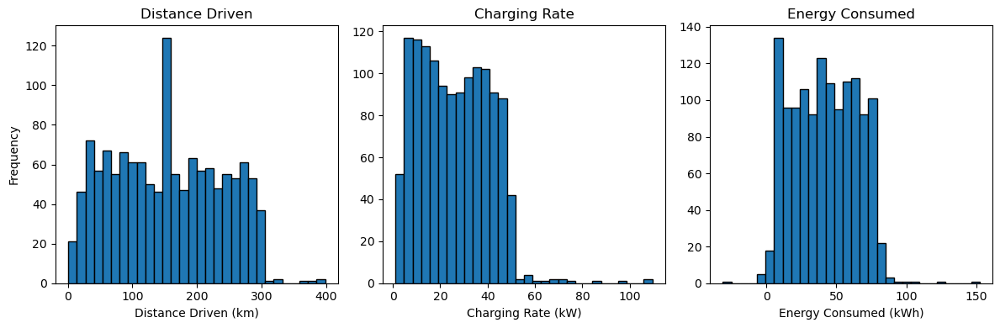

In [43]:
# ploting after impuatation 
plt.figure(figsize=(12, 4))

#  Distance Driven
plt.subplot(1, 3, 1)
plt.hist(data['Distance Driven (since last charge) (km)'], bins=30, edgecolor='black')
plt.xlabel('Distance Driven (km)')
plt.ylabel('Frequency')
plt.title('Distance Driven')

# Charging Rate
plt.subplot(1, 3, 2)
plt.hist(data['Charging Rate (kW)'], bins=30, edgecolor='black')
plt.xlabel('Charging Rate (kW)')
plt.title('Charging Rate')

#  Energy Consumed
plt.subplot(1, 3, 3)
plt.hist(data['Energy Consumed (kWh)'], bins=30, edgecolor='black')
plt.xlabel('Energy Consumed (kWh)')
plt.title('Energy Consumed')

plt.tight_layout()
plt.show()

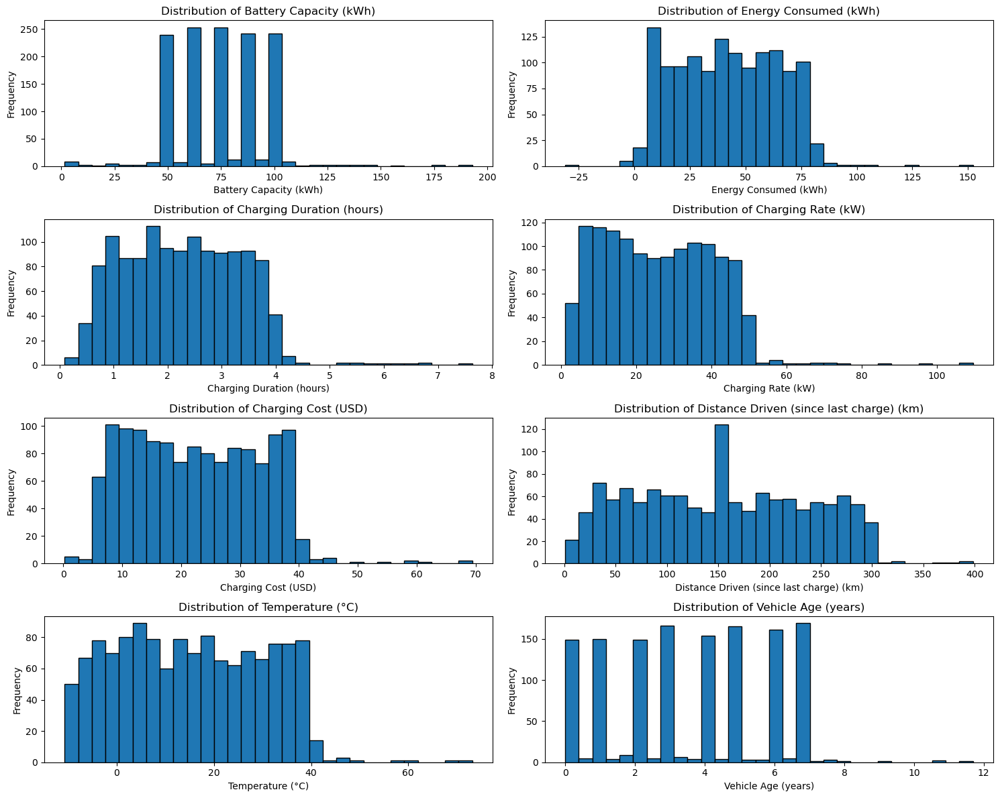

In [44]:
# distribution of the numerical columns before applying transformation techniques. 

vars_to_plot = [
    'Battery Capacity (kWh)', # is categorical like 
    'Energy Consumed (kWh)',
    'Charging Duration (hours)',
    'Charging Rate (kW)',
    'Charging Cost (USD)',
    'Distance Driven (since last charge) (km)',
    'Temperature (°C)',
    'Vehicle Age (years)'
]

plt.figure(figsize=(15, 12))

for i, col in enumerate(vars_to_plot, 1):
    plt.subplot(4, 2, i)
    plt.hist(data[col], bins=30, edgecolor='black')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {col}')

plt.tight_layout()
plt.show()

In [45]:
data['log_duration'] = np.log1p(data['Charging Duration (hours)'])
data['log_cost'] = np.log1p(data['Charging Cost (USD)'])
data['log_distance'] = np.log1p(data['Distance Driven (since last charge) (km)'])

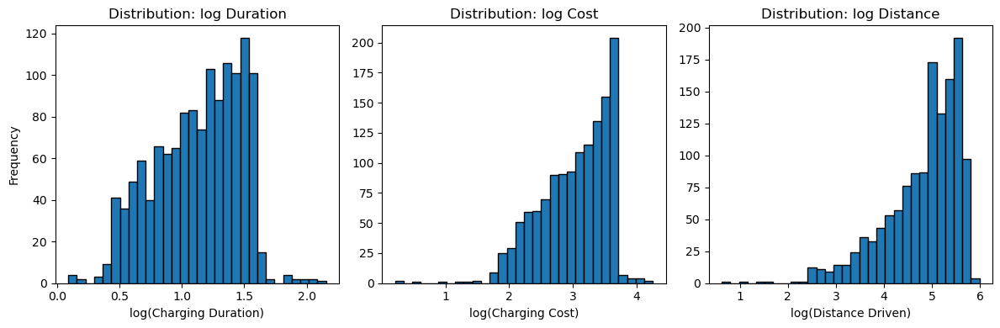

In [46]:
# distribution after log 

plt.figure(figsize=(12, 4))

# Charging Duration (log)
plt.subplot(1, 3, 1)
plt.hist(data['log_duration'], bins=30, edgecolor='black')
plt.xlabel('log(Charging Duration)')
plt.ylabel('Frequency')
plt.title('Distribution: log Duration')

# Charging Cost (log)
plt.subplot(1, 3, 2)
plt.hist(data['log_cost'], bins=30, edgecolor='black')
plt.xlabel('log(Charging Cost)')
plt.title('Distribution: log Cost')

# Distance Driven (log)
plt.subplot(1, 3, 3)
plt.hist(data['log_distance'], bins=30, edgecolor='black')
plt.xlabel('log(Distance Driven)')
plt.title('Distribution: log Distance')

plt.tight_layout()
plt.show()

In [47]:
# Applying standard scaling 

num_cols = [
    'Battery Capacity (kWh)',
    'Energy Consumed (kWh)',
    'Charging Duration (hours)',
    'Charging Rate (kW)',
    'Charging Cost (USD)',
    'Distance Driven (since last charge) (km)',
    'Temperature (°C)',
    'Vehicle Age (years)',
    'log_duration',
    'log_cost',
    'log_distance'
]


from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

scaled_values = scaler.fit_transform(data[num_cols])

data_scaled = data.copy()
data_scaled[num_cols] = scaled_values

data_scaled

,User ID,Vehicle Model,Battery Capacity (kWh),Charging Station ID,Charging Station Location,Charging Start Time,Charging End Time,Energy Consumed (kWh),Charging Duration (hours),Charging Rate (kW),...,State of Charge (Start %),State of Charge (End %),Distance Driven (since last charge) (km),Temperature (°C),Vehicle Age (years),Charger Type,User Type,log_duration,log_cost,log_distance
0,User_1,BMW i3,1.645480,Station_391,Houston,2024-01-01 00:00:00,2024-01-01 00:39:00,0.834024,-1.582085,0.711202,...,29.371576,86.119962,1.670830,0.855572,-0.698518,DC Fast Charger,Commuter,-1.937299,-0.719491,1.125054
1,User_2,Hyundai Kona,1.235035,Station_428,San Francisco,2024-01-01 01:00:00,2024-01-01 03:01:00,-1.292539,0.814865,0.320927,...,10.115778,84.664344,-0.495072,-0.064251,-0.265421,Level 1,Casual Driver,0.847701,0.118609,-0.118824
2,User_3,Chevy Bolt,0.022567,Station_181,San Francisco,2024-01-01 02:00:00,2024-01-01 04:48:00,-0.994056,0.172798,0.104715,...,6.854604,69.917615,-0.976176,0.387061,-0.698518,Level 2,Commuter,0.322489,1.055930,-0.691463
3,User_4,Hyundai Kona,-1.189901,Station_327,Houston,2024-01-01 03:00:00,2024-01-01 06:42:00,1.658107,-0.945610,0.471608,...,83.120003,99.624328,0.548739,1.554927,-1.131616,Level 1,Long-Distance Traveler,-0.905611,-0.726286,0.625518
4,User_5,Hyundai Kona,-1.189901,Station_108,Los Angeles,2024-01-01 04:00:00,2024-01-01 05:46:00,-0.972065,-0.235342,-1.077285,...,54.258950,63.743786,0.597479,-1.557967,-1.131616,Level 1,Long-Distance Traveler,-0.068356,-1.151635,0.651711
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1315,User_1316,Nissan Leaf,1.235035,Station_57,New York,2024-02-24 19:00:00,2024-02-24 20:30:00,0.011910,-0.794744,-1.372496,...,39.204102,83.915952,1.026379,-0.900061,1.466969,DC Fast Charger,Commuter,-0.706574,0.196845,0.861936
1316,User_1317,BMW i3,1.235035,Station_40,New York,2024-02-24 20:00:00,2024-02-24 20:44:00,1.162572,0.913448,-0.518855,...,31.456375,93.096461,0.128640,1.265796,0.167677,Level 2,Casual Driver,0.920582,-2.282817,0.374751
1317,User_1318,Nissan Leaf,1.235035,Station_374,New York,2024-02-24 21:00:00,2024-02-24 23:03:00,-1.004333,0.940705,1.332537,...,71.903081,78.678879,0.870260,0.343674,0.600774,DC Fast Charger,Commuter,0.940415,1.134606,0.789290
1318,User_1319,Chevy Bolt,0.507554,Station_336,San Francisco,2024-02-24 22:00:00,2024-02-24 23:20:00,-1.230246,0.457415,0.831398,...,76.187997,65.926573,1.645673,0.598357,0.600774,Level 2,Commuter,0.567037,1.219533,1.115723


In [48]:
# One-hot encode categorical variables
cat_cols = [
    'Vehicle Model',
    'Charging Station Location',
    'Charger Type',
    'User Type',
    'Time of Day',
    'Day of Week'
]

data_encoded = pd.get_dummies(data, columns=cat_cols, drop_first=False)

# Converting boolean columns to 0/1 (int)
bool_cols = data_encoded.select_dtypes(include=['bool']).columns
data_encoded[bool_cols] = data_encoded[bool_cols].astype(int)

In [49]:
data_encoded

,User ID,Battery Capacity (kWh),Charging Station ID,Charging Start Time,Charging End Time,Energy Consumed (kWh),Charging Duration (hours),Charging Rate (kW),Charging Cost (USD),State of Charge (Start %),...,Time of Day_Evening,Time of Day_Morning,Time of Day_Night,Day of Week_Friday,Day of Week_Monday,Day of Week_Saturday,Day of Week_Sunday,Day of Week_Thursday,Day of Week_Tuesday,Day of Week_Wednesday
0,User_1,108.463007,Station_391,2024-01-01 00:00:00,2024-01-01 00:39:00,60.712346,0.591363,36.389181,13.087717,29.371576,...,1,0,0,0,0,0,0,0,1,0
1,User_2,100.000000,Station_428,2024-01-01 01:00:00,2024-01-01 03:01:00,12.339275,3.133652,30.677735,21.128448,10.115778,...,0,1,0,0,1,0,0,0,0,0
2,User_3,75.000000,Station_181,2024-01-01 02:00:00,2024-01-01 04:48:00,19.128876,2.452653,27.513593,35.667270,6.854604,...,0,1,0,0,0,0,0,1,0,0
3,User_4,50.000000,Station_327,2024-01-01 03:00:00,2024-01-01 06:42:00,79.457824,1.266431,32.882870,13.036239,83.120003,...,1,0,0,0,0,1,0,0,0,0
4,User_5,50.000000,Station_108,2024-01-01 04:00:00,2024-01-01 05:46:00,19.629104,2.019765,10.215712,10.161471,54.258950,...,0,1,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1315,User_1316,100.000000,Station_57,2024-02-24 19:00:00,2024-02-24 20:30:00,42.011654,1.426444,5.895475,22.081164,39.204102,...,1,0,0,0,0,0,1,0,0,0
1316,User_1317,100.000000,Station_40,2024-02-24 20:00:00,2024-02-24 20:44:00,68.185853,3.238212,18.388012,5.067806,31.456375,...,1,0,0,0,0,0,0,0,1,0
1317,User_1318,100.000000,Station_374,2024-02-24 21:00:00,2024-02-24 23:03:00,18.895102,3.267122,45.482066,37.255002,71.903081,...,1,0,0,0,0,0,0,0,1,0
1318,User_1319,85.000000,Station_336,2024-02-24 22:00:00,2024-02-24 23:20:00,13.756252,2.754527,38.148183,39.046146,76.187997,...,0,0,0,0,0,0,1,0,0,0


In [50]:
# Saving User ID separately for better visulization with ID for each data points. 
user_ids = data_encoded['User ID']

# Droping User ID for training
X = data_encoded.drop(columns=['User ID'])

cols_to_drop = [
    'User ID',
    'Charging Station ID',
    'Charging Start Time',
    'Charging End Time',
    'Charging Duration (hours)',
    'Charging Cost (USD)',
    'Distance Driven (since last charge) (km)'
]

X = data_encoded.drop(columns=cols_to_drop)
X

,Battery Capacity (kWh),Energy Consumed (kWh),Charging Rate (kW),State of Charge (Start %),State of Charge (End %),Temperature (°C),Vehicle Age (years),log_duration,log_cost,log_distance,...,Time of Day_Evening,Time of Day_Morning,Time of Day_Night,Day of Week_Friday,Day of Week_Monday,Day of Week_Saturday,Day of Week_Sunday,Day of Week_Thursday,Day of Week_Tuesday,Day of Week_Wednesday
0,108.463007,60.712346,36.389181,29.371576,86.119962,27.947953,2.0,0.464591,2.645303,5.685626,...,1,0,0,0,0,0,0,0,1,0
1,100.000000,12.339275,30.677735,10.115778,84.664344,14.311026,3.0,1.419161,3.096864,4.728386,...,0,1,0,0,1,0,0,0,0,0
2,75.000000,19.128876,27.513593,6.854604,69.917615,21.002002,2.0,1.239143,3.601885,4.287706,...,0,1,0,0,0,0,0,1,0,0
3,50.000000,79.457824,32.882870,83.120003,99.624328,38.316313,1.0,0.818206,2.641642,5.301202,...,1,0,0,0,0,1,0,0,0,0
4,50.000000,19.629104,10.215712,54.258950,63.743786,-7.834199,1.0,1.105179,2.412468,5.321359,...,0,1,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1315,100.000000,42.011654,5.895475,39.204102,83.915952,1.919655,7.0,0.886427,3.139017,5.483140,...,1,0,0,0,0,0,1,0,0,0
1316,100.000000,68.185853,18.388012,31.456375,93.096461,34.029775,4.0,1.444142,1.802997,5.108222,...,1,0,0,0,0,0,0,0,1,0
1317,100.000000,18.895102,45.482066,71.903081,78.678879,20.358761,5.0,1.450940,3.644274,5.427235,...,1,0,0,0,0,0,0,0,1,0
1318,85.000000,13.756252,38.148183,76.187997,65.926573,24.134598,5.0,1.322962,3.690032,5.678444,...,0,0,0,0,0,0,1,0,0,0


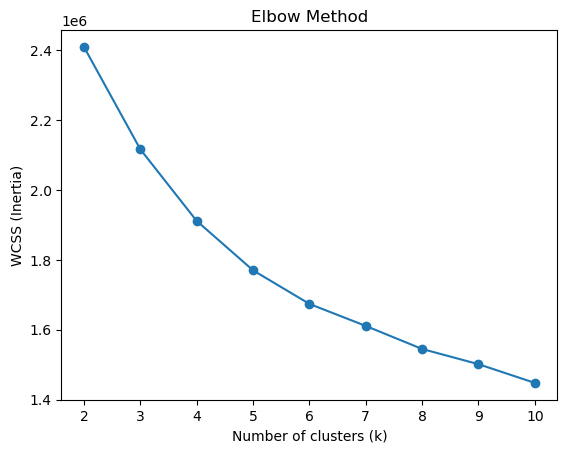

In [51]:
# Elbow Method (Simple Code)
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

wcss = []

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.plot(range(2, 11), wcss, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS (Inertia)')
plt.title('Elbow Method')
plt.show()

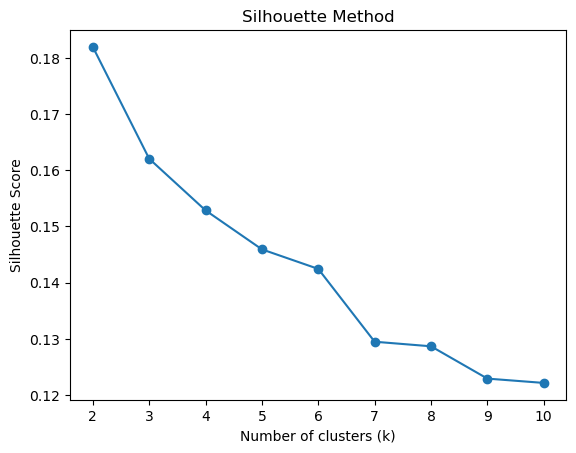

In [52]:
# Silhouette Score

from sklearn.metrics import silhouette_score

sil_scores = []

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    labels = kmeans.fit_predict(X)
    sil_scores.append(silhouette_score(X, labels))

plt.plot(range(2, 11), sil_scores, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method')
plt.show()

In [ ]:
*** K_Mean

In [53]:
# Training K-Means with k = 3
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3, random_state=42, n_init='auto')
kmeans.fit(X)

labels = kmeans.labels_

In [54]:
#Attaching cluster labels back to User IDs
result = pd.DataFrame({
    'User ID': user_ids,
    'Cluster': labels
})

In [55]:
# how many users in each cluster
print(result['Cluster'].value_counts())

Cluster
0    547
1    387
2    386
Name: count, dtype: int64


In [56]:
data_clean = data_encoded.copy()

In [57]:
# Adding cluster label back to full dataset
data_clean['Cluster'] = labels

In [58]:
# See cluster sizes
print(data_clean['Cluster'].value_counts())

Cluster
0    547
1    387
2    386
Name: count, dtype: int64


In [59]:
from sklearn.decomposition import PCA

# PCA with 2 components
pca2 = PCA(n_components=2)
X_pca2 = pca2.fit_transform(X)

print("Explained Variance Ratio (PCA 2D):")
for i, var in enumerate(pca2.explained_variance_ratio_):
    print(f"PC{i+1}: {var:.4f}")

print("Total Variance (2 PCs):", pca2.explained_variance_ratio_.sum())

Explained Variance Ratio (PCA 2D):
PC1: 0.2628
PC2: 0.2270
Total Variance (2 PCs): 0.48977964842515087


In [60]:
# PCA with 3 components
pca3 = PCA(n_components=3)
X_pca3 = pca3.fit_transform(X)

print("\nExplained Variance Ratio (PCA 3D):")
for i, var in enumerate(pca3.explained_variance_ratio_):
    print(f"PC{i+1}: {var:.4f}")

print("Total Variance (3 PCs):", pca3.explained_variance_ratio_.sum())


Explained Variance Ratio (PCA 3D):
PC1: 0.2628
PC2: 0.2270
PC3: 0.1851
Total Variance (3 PCs): 0.6748507456295485


In [61]:
# data itself(X) for parameter tuning (with K-mean) without applying PCA 

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

# Parameter grids
k_values = [2, 3, 4, 5, 6]
n_init_values = [10, 20, 30]
init_methods = ['k-means++', 'random']
max_iter_values = [300, 500, 800]

best_score_1 = -1
best_params_1 = None
best_labels_1 = None

for k in k_values:
    for n_init in n_init_values:
        for init_method in init_methods:
            for max_iter in max_iter_values:

                model = KMeans(
                    n_clusters=k,
                    n_init=n_init,
                    init=init_method,
                    max_iter=max_iter,
                    random_state=42
                )

                labels_1 = model.fit_predict(X)

                
                sil_1 = silhouette_score(X, labels_1)

                
                if sil_1 > best_score_1:
                    best_score_1 = sil_1
                    best_params_1 = (k, n_init, init_method, max_iter)

                    
                    best_labels_1 = labels_1



In [62]:
print("Best Silhouette Score:", best_score_1)
print("Best Parameters:")
print("k =", best_params_1[0])
print("n_init =", best_params_1[1])
print("init =", best_params_1[2])
print("max_iter =", best_params_1[3])

print("\nCluster counts:")
unique, counts = np.unique(best_labels_1, return_counts=True)
for u, c in zip(unique, counts):
    print(f"Cluster {u}: {c} observations")

Best Silhouette Score: 0.18224147796287188
Best Parameters:
k = 2
n_init = 10
init = k-means++
max_iter = 300

Cluster counts:
Cluster 0: 646 observations
Cluster 1: 674 observations


In [64]:
# applying 2Dimensional PCA 
k_values = [2, 3, 4, 5, 6]
n_init_values = [10, 20, 30]
init_methods = ['k-means++', 'random']
max_iter_values = [300, 500, 800]

best_score_2 = -1
best_params_2 = None
best_labels_2 = None

for k in k_values:
    for n_init in n_init_values:
        for init_method in init_methods:
            for max_iter in max_iter_values:

                kmeans_pca2 = KMeans(
                    n_clusters=k,
                    n_init=n_init,
                    init=init_method,
                    max_iter=max_iter,
                    random_state=42
                )

                labels_2 = kmeans_pca2.fit_predict(X_pca2)

                
                sil_2 = silhouette_score(X_pca2, labels_2)

                
                if sil_2 > best_score_2:
                    best_score_2 = sil_2
                    best_params_2 = (k, n_init, init_method, max_iter)

                    
                    best_labels_2 = labels_2

In [65]:
print("Best Silhouette Score:", best_score_2)
print("Best Parameters:")
print("k =", best_params_2[0])
print("n_init =", best_params_2[1])
print("init =", best_params_2[2])
print("max_iter =", best_params_2[3])

print("\nCluster counts:")
unique, counts = np.unique(best_labels_2, return_counts=True)
for u, c in zip(unique, counts):
    print(f"Cluster {u}: {c} observations")
    
    
# # 2. Davies–Bouldin Index (lower = better)
# db_score = davies_bouldin_score(X, labels)
# # 3. Calinski–Harabasz Score (higher = better)
# ch_score = calinski_harabasz_score(X, labels)

Best Silhouette Score: 0.3925526454413585
Best Parameters:
k = 4
n_init = 10
init = random
max_iter = 300

Cluster counts:
Cluster 0: 336 observations
Cluster 1: 344 observations
Cluster 2: 333 observations
Cluster 3: 307 observations


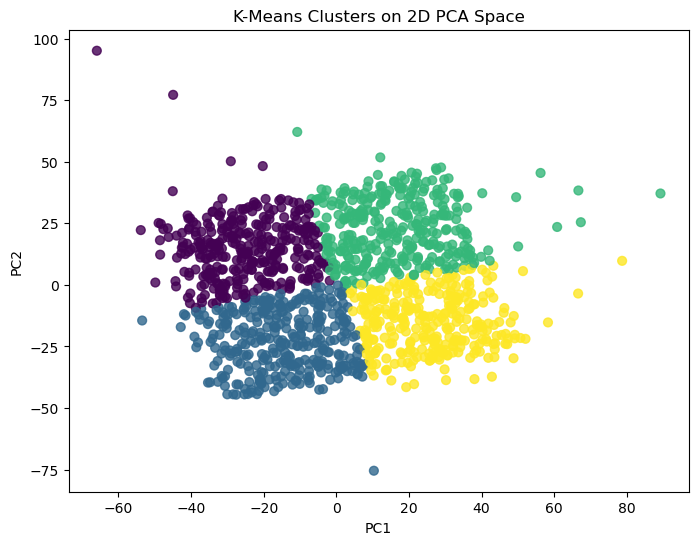

In [66]:
# best_labels: cluster labels from best K-Means model

plt.figure(figsize=(8, 6))

plt.scatter(
    X_pca2[:, 0],      # PC1
    X_pca2[:, 1],      # PC2
    c=best_labels_2,     # color by cluster
    cmap='viridis',
    s=40,
    alpha=0.8
)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("K-Means Clusters on 2D PCA Space")

plt.show()

In [67]:
# applying 3Dimensional PCA 
k_values = [2, 3, 4, 5, 6]
n_init_values = [10, 20, 30]
init_methods = ['k-means++', 'random']
max_iter_values = [300, 500, 800]

best_score_3 = -1
best_params_3 = None
best_labels_3 = None

for k in k_values:
    for n_init in n_init_values:
        for init_method in init_methods:
            for max_iter in max_iter_values:

                model = KMeans(
                    n_clusters=k,
                    n_init=n_init,
                    init=init_method,
                    max_iter=max_iter,
                    random_state=42
                )

                labels_3 = model.fit_predict(X_pca3)

                sil_3 = silhouette_score(X_pca3, labels_3)

                if sil_3 > best_score_3:
                    best_score_3 = sil_3
                    best_params_3 = (k, n_init, init_method, max_iter)
                    best_labels_3 = labels_3

In [68]:
print("Best Silhouette Score:", best_score_3)
print("Best Parameters:")
print("k =", best_params_3[0])
print("n_init =", best_params_3[1])
print("init =", best_params_3[2])
print("max_iter =", best_params_3[3])

print("\nCluster counts:")
unique, counts = np.unique(best_labels_3, return_counts=True)
for u, c in zip(unique, counts):
    print(f"Cluster {u}: {c} observations")

Best Silhouette Score: 0.2727260311469206
Best Parameters:
k = 2
n_init = 10
init = k-means++
max_iter = 300

Cluster counts:
Cluster 0: 646 observations
Cluster 1: 674 observations


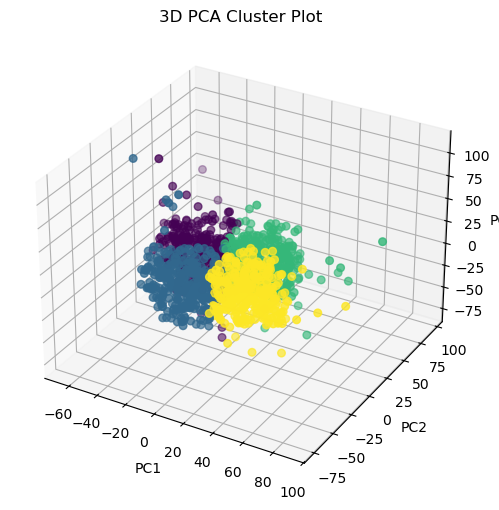

In [69]:
# 3D Scatter Plot of Clusters with parameter that we got for the second parameter tuning (PCA2), because it gave the best
# result in terms of silluette score. 
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(
    X_pca3[:, 0], 
    X_pca3[:, 1], 
    X_pca3[:, 2],
    c=best_labels_2,          # color by cluster
    cmap='viridis',
    s=30
)

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('3D PCA Cluster Plot')

plt.show()

In [70]:
import plotly.express as px
import plotly.io as pio
pio.renderers.default = "notebook"

In [71]:
import plotly.express as px

df_plot = pd.DataFrame({
    'PC1': X_pca3[:, 0],
    'PC2': X_pca3[:, 1],
    'PC3': X_pca3[:, 2],
    'Cluster': best_labels_2,
    'User ID': user_ids
})

# interactive 3D plot
fig = px.scatter_3d(
    df_plot,
    x='PC1',
    y='PC2',
    z='PC3',
    color='Cluster',
    hover_name='User ID',      #  User ID on hover
    hover_data=['User ID'],    
    title='Interactive 3D PCA Plot (with User IDs)',
    opacity=0.8
)

fig.update_traces(marker=dict(size=4))

fig.show()

In [72]:
# how much each variable contributes to PC1, PC2, and PC3.
# Create a PCA loadings table for PCA with 2 components (X_pca2)

loadings_2 = pd.DataFrame(
    pca2.components_.T,           
    columns=['PC1', 'PC2'],      
    index=X.columns              
)

loadings_2

,PC1,PC2
Battery Capacity (kWh),-0.207834,-0.067181
Energy Consumed (kWh),-0.259868,0.964339
Charging Rate (kW),-0.009752,0.007938
State of Charge (Start %),0.941339,0.253137
State of Charge (End %),-0.032649,0.036243
Temperature (°C),0.044576,-0.008632
Vehicle Age (years),0.000901,0.000208
log_duration,-0.000367,0.000341
log_cost,0.000108,-0.000379
log_distance,-0.000044,-0.000496


In [ ]:
# This PCA loadings table shows how strongly each variable contributes to the two principal components.
# PC1 is driven almost entirely by State of Charge (Start %), meaning this component represents variation in starting
# battery levels.
# PC2 is dominated by Energy Consumed (kWh), indicating that it reflects differences in energy usage during charging 
# sessions.
# All other numerical variables have very small loadings, so they contribute minimally to the variance captured by the 
# first two components.
# Similarly, the one-hot encoded categorical variables show near-zero loadings, meaning PCA did not find meaningful linear
# variation in these features.
# Overall, the table reveals that the main structure in the data is explained by starting battery charge and energy 
# consumed, while most other features play little role in the first two principal components.

In [73]:
best_k = best_params_2[0]
best_n_init = best_params_2[1]
best_init = best_params_2[2]
best_max_iter = best_params_2[3]

# Refitting the correct model
kmeans_best = KMeans(
    n_clusters=best_k,
    n_init=best_n_init,
    init=best_init,
    max_iter=best_max_iter,
    random_state=42
).fit(X_pca2)

In [74]:
centroids_pca2 = pd.DataFrame(
    kmeans_best.cluster_centers_,
    columns=['PC1', 'PC2']
)

centroids_pca2

,PC1,PC2
0,-25.010114,14.600625
1,-14.510830,-22.680146
2,16.427160,22.575053
3,25.678966,-15.079176


In [ ]:
# The centroids show four distinct EV-charging behavior groups based on PCA features:
# (1) low-battery heavy chargers, (2) low-battery light chargers, (3) high-battery heavy chargers, and (4) high-battery 
# light chargers.
# Clusters differ mainly by starting battery level (PC1) and energy consumed (PC2), the two dominant patterns in the
# dataset.

In [75]:
# centroids in ORIGINAL feature space:

centroids_original = pd.DataFrame(
    pca2.inverse_transform(kmeans_best.cluster_centers_),
    columns=X.columns
)

centroids_original

,Battery Capacity (kWh),Energy Consumed (kWh),Charging Rate (kW),State of Charge (Start %),State of Charge (End %),Temperature (°C),Vehicle Age (years),log_duration,log_cost,log_distance,...,Time of Day_Evening,Time of Day_Morning,Time of Day_Night,Day of Week_Friday,Day of Week_Monday,Day of Week_Saturday,Day of Week_Sunday,Day of Week_Thursday,Day of Week_Tuesday,Day of Week_Wednesday
0,78.751758,62.320040,26.340963,29.282981,76.487322,14.022713,3.593352,1.142765,3.024731,4.813698,...,0.294425,0.242673,0.227036,0.152296,0.135502,0.160251,0.146503,0.104472,0.141479,0.159497
1,79.074204,23.640292,25.942620,29.729224,74.793371,14.812550,3.595066,1.126200,3.039992,4.831709,...,0.286965,0.250803,0.240564,0.147728,0.143434,0.163132,0.143469,0.117084,0.147645,0.137507
2,69.603961,59.241859,26.000164,70.308112,75.423433,15.800961,3.632324,1.130277,3.026171,4.807914,...,0.259941,0.259095,0.232565,0.136378,0.137031,0.146933,0.145860,0.116940,0.156091,0.160767
3,70.210765,20.526151,25.611023,69.485520,73.756677,16.538415,3.632837,1.114043,3.041439,4.826166,...,0.253523,0.266744,0.245967,0.132287,0.144942,0.150237,0.142836,0.129208,0.161825,0.138663


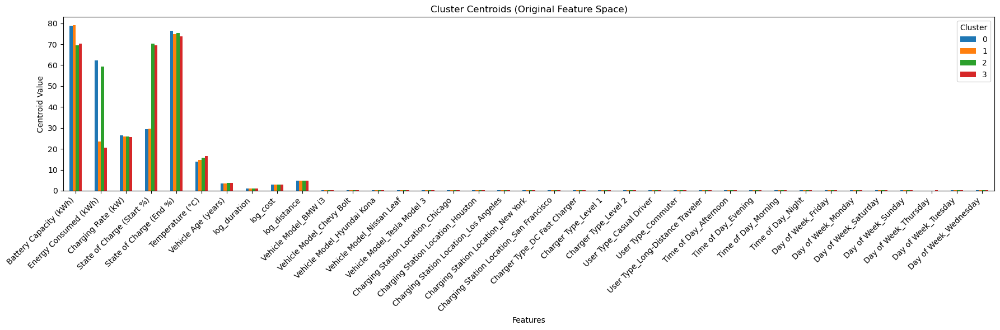

In [76]:
# Simple plot of each centroid,  how clusters differ across features.

centroids_original.T.plot(kind='bar', figsize=(18,6))
plt.title("Cluster Centroids (Original Feature Space)")
plt.xlabel("Features")
plt.ylabel("Centroid Value")
plt.legend(title="Cluster")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

In [77]:
# alternative way for clustering 
data_clean['Cluster'] = best_labels_2

# Compute cluster profile
cluster_profile_2 = data_clean.groupby('Cluster').mean(numeric_only=True)

cluster_profile_2.round(2)

,Battery Capacity (kWh),Energy Consumed (kWh),Charging Duration (hours),Charging Rate (kW),Charging Cost (USD),State of Charge (Start %),State of Charge (End %),Distance Driven (since last charge) (km),Temperature (°C),Vehicle Age (years),...,Time of Day_Evening,Time of Day_Morning,Time of Day_Night,Day of Week_Friday,Day of Week_Monday,Day of Week_Saturday,Day of Week_Sunday,Day of Week_Thursday,Day of Week_Tuesday,Day of Week_Wednesday
Cluster,,,,,,,,,,,,,,,,,,,,,
0,77.79,62.25,2.35,26.72,22.07,29.14,77.01,151.88,14.22,3.68,...,0.31,0.22,0.25,0.13,0.15,0.14,0.14,0.12,0.15,0.17
1,77.81,23.65,2.24,25.75,23.24,29.44,74.25,159.70,14.57,3.66,...,0.28,0.26,0.24,0.15,0.14,0.17,0.15,0.12,0.15,0.13
2,71.31,59.30,2.25,26.13,22.88,70.74,75.18,148.64,16.04,3.55,...,0.23,0.30,0.22,0.13,0.12,0.17,0.15,0.12,0.15,0.16
3,70.80,20.52,2.24,25.27,21.95,69.63,74.05,154.01,16.34,3.56,...,0.28,0.24,0.24,0.16,0.15,0.14,0.14,0.11,0.16,0.14


In [78]:
# Top features that differ between clusters
cluster_diff = cluster_profile_2.T   # transpose to compare features
cluster_diff

Cluster,0,1,2,3
Battery Capacity (kWh),77.787698,77.807034,71.314680,70.800386
Energy Consumed (kWh),62.248126,23.647180,59.304135,20.519564
Charging Duration (hours),2.345561,2.244080,2.249927,2.235441
Charging Rate (kW),26.716720,25.751329,26.132662,25.269286
Charging Cost (USD),22.074515,23.238633,22.877336,21.949526
State of Charge (Start %),29.135114,29.442075,70.744177,69.629747
State of Charge (End %),77.014669,74.248471,75.183639,74.046723
Distance Driven (since last charge) (km),151.877916,159.696648,148.644669,154.014522
Temperature (°C),14.224171,14.566934,16.035931,16.344069
Vehicle Age (years),3.676087,3.659151,3.552134,3.557586


In [ ]:
# Cluster 0 — Low Battery, Heavy Charging

# SOC Start ≈ 29% (very low)
# Energy Consumed ≈ 62 kWh (very high)
# Charging Duration ≈ 2.35 hrs (longest among clusters)
# Charging Rate ≈ 26.7 kW
# Logs (duration, cost, distance) slightly above average

# This cluster represents EV users who arrive with low battery and perform long, heavy charging sessions.


# Cluster 1 — Low Battery, Light Charging

# SOC Start ≈ 29% (same as Cluster 0)
# Energy Consumed ≈ 23.6 kWh (much lower)
# Charging Duration ≈ 2.24 hrs
# Charging Rate ≈ 25.7 kW
# Costs around average

# Users who also start with low battery but only do small top-ups instead of long sessions.


# Cluster 2 — High Battery, Heavy Charging

# SOC Start ≈ 70.7% (very high)
# Energy Consumed ≈ 59.3 kWh
# Charging Duration ≈ 2.25 hrs
# Charging Rate ≈ 26.1 kW

# Users starting with a high battery but still consuming lots of energy — likely long-distance travelers doing deeper
# recharges.



# Cluster 3 — High Battery, Light Charging

# SOC Start ≈ 69.6%
# Energy Consumed ≈ 20.5 kWh (lowest among high-SOC groups)
# Charging Duration ≈ 2.23 hrs
# Charging Rate ≈ 25.3 kW

# Users who arrive with a high battery and only top-up lightly.




# Cluster Based on dominant variables:
# 1. Starting Battery Level (SOC Start %) SPLITS THE CLUSTERS INTO TWO BIG GROUPS

# Low SOC (~29%) → Clusters 0 & 1
# High SOC (~70%) → Clusters 2 & 3

# 2. Energy Consumed SPLITS EACH GROUP FURTHER

# High Energy (~60 kWh) → Clusters 0 & 2
# Low Energy (~20 kWh) → Clusters 1 & 3

In [ ]:
# This clustering reveals four distinct EV-charging behavior groups based on starting battery level and energy consumed.
# Cluster 0 represents low-battery heavy chargers—drivers arriving almost empty and doing long, deep charging sessions; 
# these users depend heavily on public charging and may require more fast-charger availability.
# Cluster 1 identifies low-battery light chargers—drivers who start low but only top-up lightly, suggesting quick-stop 
# behavior or short-trip commuters.
# Cluster 2 captures high-battery heavy chargers—drivers who begin with a good battery level but still consume a lot of 
# energy, likely long-distance travelers who recharge proactively.
# Cluster 3 shows high-battery light chargers—drivers who arrive with high charge and only add small amounts, indicating
# opportunistic or routine top-ups.
# Charging duration and rate remain similar across clusters, meaning the amount of energy needed, not charging speed drive
# behavior differences.
# Categorical factors (vehicle type, location, time of day) are evenly distributed, confirming that clusters reflect 
# behavioral patterns rather than demographics.
# The implication is that charging stations can tailor strategies: 
# more fast chargers for heavy chargers, more short-stay
# spots for light chargers, and dynamic pricing or incentives to manage peak demand.
# These clusters help predict user needs, optimize station operations, and design targeted energy-management policies.
# The segmentation offers practical insights for improving charger allocation, reducing congestion, and adapting pricing 
# to specific charging behaviors.

<Figure size 1400x600 with 0 Axes>

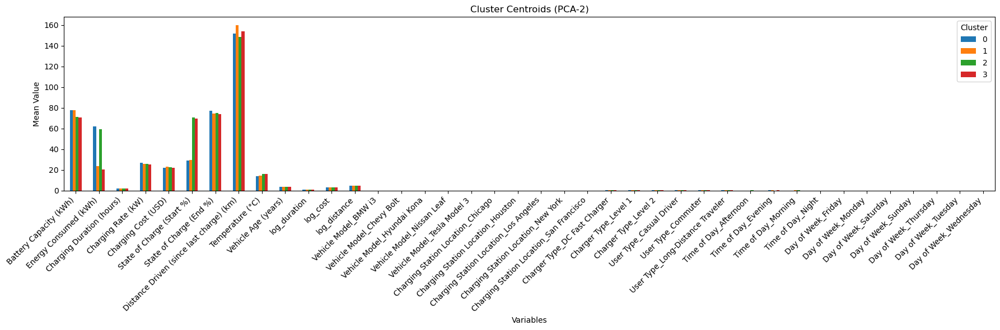

In [79]:
plt.figure(figsize=(14, 6))

cluster_profile_2.T.plot(kind='bar', figsize=(18,6))
plt.title("Cluster Centroids (PCA-2)")
plt.ylabel("Mean Value")
plt.xlabel("Variables")
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

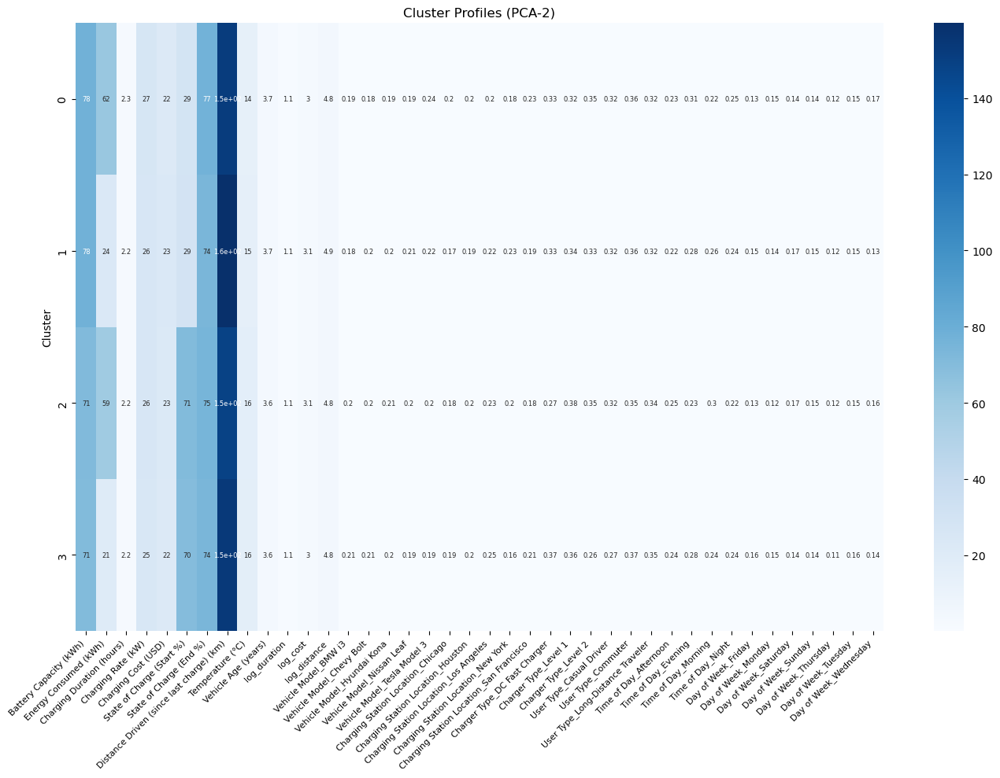

In [80]:
plt.figure(figsize=(14,10))

sns.heatmap(
    cluster_profile_2,
    annot=True,
    cmap='Blues',
    annot_kws={"size": 6}   # smaller annotation text
)

plt.title("Cluster Profiles (PCA-2)")
plt.xticks(rotation=45, ha='right', fontsize=8)   # rotate and shrink labels
plt.yticks(fontsize=10)

plt.tight_layout()     # prevent cutoff / overlapping
plt.show()

In [ ]:
*** GMM 

In [81]:
#GMM for different k and collect AIC/BIC
from sklearn.mixture import GaussianMixture

ks = range(2, 8)   # try k = 2 to 7
aic_scores = []
bic_scores = []

for k in ks:
    gmm = GaussianMixture(n_components=k, covariance_type='full', random_state=42)
    gmm.fit(X)      # use PCA data or original X
    aic_scores.append(gmm.aic(X))
    bic_scores.append(gmm.bic(X))

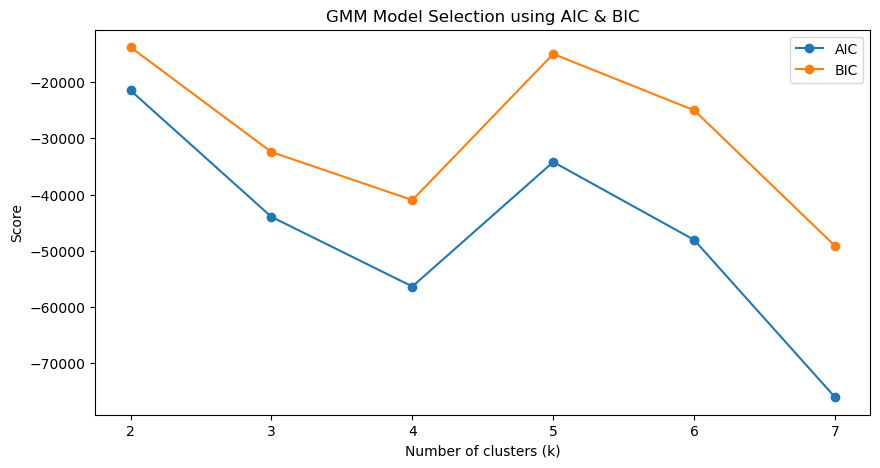

In [82]:
plt.figure(figsize=(10, 5))
plt.plot(ks, aic_scores, label='AIC', marker='o')
plt.plot(ks, bic_scores, label='BIC', marker='o')
plt.xlabel("Number of clusters (k)")
plt.ylabel("Score")
plt.title("GMM Model Selection using AIC & BIC")
plt.legend()
plt.show()

In [83]:
# Training final GMM with the chosen k (example k=4)

best_k = 4
gmm = GaussianMixture(n_components=best_k, covariance_type='full', random_state=42)
gmm.fit(X)
labels_gmm = gmm.predict(X)

In [84]:
#  GMM performance evaluation 

from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

print("Silhouette:", silhouette_score(X, labels_gmm))
print("Davies-Bouldin:", davies_bouldin_score(X, labels_gmm))
print("Calinski-Harabasz:", calinski_harabasz_score(X, labels_gmm))

Silhouette: -0.010507676031395219
Davies-Bouldin: 27.262705773279286
Calinski-Harabasz: 1.1815859757930491


In [85]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# Parameter grid
k_values = [3, 4, 5, 6, 7]
cov_types = ['full', 'tied', 'diag', 'spherical']
n_init_values = [1, 5]
max_iter_values = [200, 300]

best_score_GMM_1 = -1
best_params_GMM_1 = None
best_model_GMM_1 = None
best_labels_GMM_1 = None

results = []

for k in k_values:
    for cov in cov_types:
        for n_init in n_init_values:
            for max_iter in max_iter_values:
                try:
                    gmm_1 = GaussianMixture(
                        n_components=k,
                        covariance_type=cov,
                        n_init=n_init,
                        max_iter=max_iter,
                        random_state=42
                    )
                    
                    gmm_1.fit(X)
                    labels = gmm_1.predict(X)

                    # Computing metrics
                    sil_GMM_1 = silhouette_score(X, labels)
                    db_GMM_1 = davies_bouldin_score(X, labels)
                    ch_GMM_1 = calinski_harabasz_score(X, labels)

                    # Saving this combination's results
                    results.append((k, cov, n_init, max_iter, sil_GMM_1, db_GMM_1, ch_GMM_1))

                    #  silhouette score
                    if sil_GMM_1 > best_score_GMM_1:
                        best_score_GMM_1 = sil_GMM_1
                        best_params_GMM_1 = (k, cov, n_init, max_iter)
                        best_model_GMM_1 = gmm_1
                        best_labels_GMM_1 = labels

                except:
                    continue

In [86]:
print("Best Silhouette Score (GMM):", best_score_GMM_1)
print("Best Parameters (GMM):")
print("k           =", best_params_GMM_1[0])
print("covariance  =", best_params_GMM_1[1])
print("n_init      =", best_params_GMM_1[2])
print("max_iter    =", best_params_GMM_1[3])

print("\nCluster counts (best GMM model):")
unique, counts = np.unique(best_labels_GMM_1, return_counts=True)
for u, c in zip(unique, counts):
    print(f"Cluster {u}: {c} observations")

Best Silhouette Score (GMM): 0.15758205608526776
Best Parameters (GMM):
k           = 3
covariance  = spherical
n_init      = 1
max_iter    = 200

Cluster counts (best GMM model):
Cluster 0: 580 observations
Cluster 1: 373 observations
Cluster 2: 367 observations


In [87]:
k_values = [3, 4, 5, 6, 7]
cov_types = ['full', 'tied', 'diag', 'spherical']
n_init_values = [1, 5]
max_iter_values = [200, 300]

best_score_GMM_2 = -1
best_params_GMM_2 = None
best_model_GMM_2 = None
best_labels_GMM_2 = None

results = []

for k in k_values:
    for cov in cov_types:
        for n_init in n_init_values:
            for max_iter in max_iter_values:
                try:
                    gmm_2 = GaussianMixture(
                        n_components=k,
                        covariance_type=cov,
                        n_init=n_init,
                        max_iter=max_iter,
                        random_state=42
                    )
                    
                    
                    gmm_2.fit(X_pca2)
                    
                    
                    labels = gmm_2.predict(X_pca2)

                    
                    sil_GMM_2 = silhouette_score(X_pca2, labels)

                
                    results.append((k, cov, n_init, max_iter, sil_GMM_2))

                    
                    if sil_GMM_2 > best_score_GMM_2:
                        best_score_GMM_2 = sil_GMM_2
                        best_params_GMM_2 = (k, cov, n_init, max_iter)
                        best_model_GMM_2 = gmm_2
                        best_labels_GMM_2 = labels

                except:
                    continue

In [88]:
print("Best Silhouette Score (GMM on PCA2):", best_score_GMM_2)

print("\nBest Parameters:")
print("k =", best_params_GMM_2[0])
print("covariance =", best_params_GMM_2[1])
print("n_init =", best_params_GMM_2[2])
print("max_iter =", best_params_GMM_2[3])

print("\nCluster counts:")
unique, counts = np.unique(best_labels_GMM_2, return_counts=True)
for u, c in zip(unique, counts):
    print(f"Cluster {u}: {c} observations")

Best Silhouette Score (GMM on PCA2): 0.39162973581794086

Best Parameters:
k = 4
covariance = spherical
n_init = 1
max_iter = 200

Cluster counts:
Cluster 0: 337 observations
Cluster 1: 293 observations
Cluster 2: 347 observations
Cluster 3: 343 observations


In [89]:
k_values = [3, 4, 5, 6, 7]
cov_types = ['full', 'tied', 'diag', 'spherical']
n_init_values = [1, 5]
max_iter_values = [200, 300]

best_score_GMM_3 = -1
best_params_GMM_3 = None
best_model_GMM_3 = None
best_labels_GMM_3 = None

results = []

for k in k_values:
    for cov in cov_types:
        for n_init in n_init_values:
            for max_iter in max_iter_values:
                try:
                    gmm_3 = GaussianMixture(
                        n_components=k,
                        covariance_type=cov,
                        n_init=n_init,
                        max_iter=max_iter,
                        random_state=42
                    )
                    
                    
                    gmm_3.fit(X_pca3)
                    
                  
                    labels = gmm_3.predict(X_pca3)

                    
                    sil_GMM_3 = silhouette_score(X_pca3, labels)

                    
                    results.append((k, cov, n_init, max_iter, sil_GMM_3))

                    
                    if sil_GMM_3 > best_score_GMM_3:
                        best_score_GMM_3 = sil_GMM_3
                        best_params_GMM_3 = (k, cov, n_init, max_iter)
                        best_model_GMM_3 = gmm_3
                        best_labels_GMM_3 = labels

                except:
                    continue

In [90]:
print("Best Silhouette Score (GMM on PCA2):", best_score_GMM_3)

print("\nBest Parameters:")
print("k =", best_params_GMM_3[0])
print("covariance =", best_params_GMM_3[1])
print("n_init =", best_params_GMM_3[2])
print("max_iter =", best_params_GMM_3[3])

print("\nCluster counts:")
unique, counts = np.unique(best_labels_GMM_3, return_counts=True)
for u, c in zip(unique, counts):
    print(f"Cluster {u}: {c} observations")

Best Silhouette Score (GMM on PCA2): 0.2578606060887519

Best Parameters:
k = 4
covariance = tied
n_init = 1
max_iter = 200

Cluster counts:
Cluster 0: 355 observations
Cluster 1: 292 observations
Cluster 2: 326 observations
Cluster 3: 347 observations


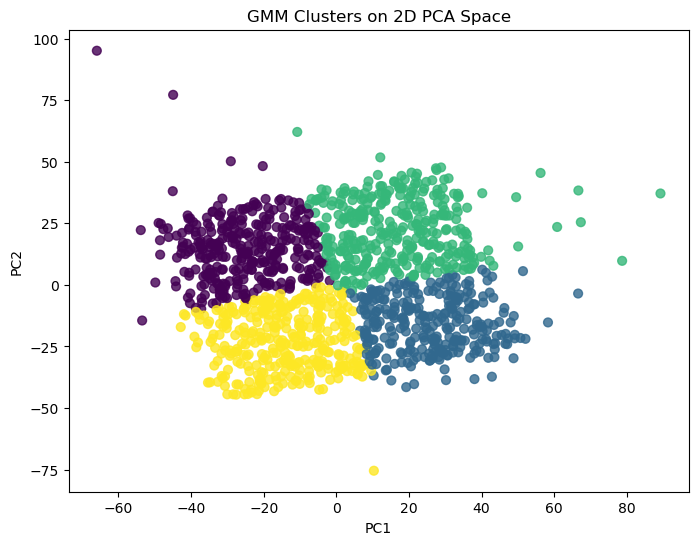

In [91]:
# the best model is with pca2 

plt.figure(figsize=(8, 6))

plt.scatter(
    X_pca2[:, 0],      # PC1
    X_pca2[:, 1],      # PC2
    c=best_labels_GMM_2,     # color by cluster
    cmap='viridis',
    s=40,
    alpha=0.8
)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("GMM Clusters on 2D PCA Space")

plt.show()

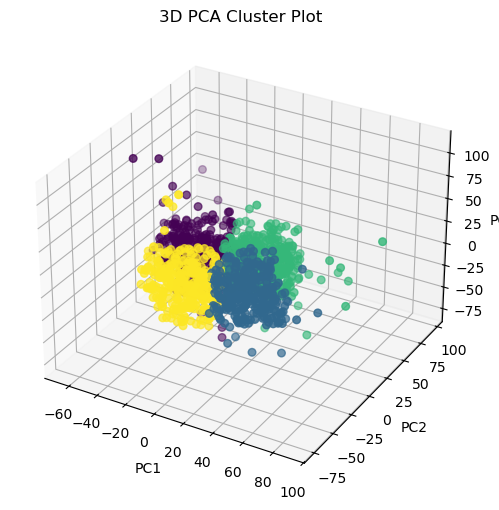

In [92]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(
    X_pca3[:, 0], 
    X_pca3[:, 1], 
    X_pca3[:, 2],
    c=best_labels_GMM_2,          # color by cluster
    cmap='viridis',
    s=30
)

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('3D PCA Cluster Plot')

plt.show()

In [93]:
df_plot = pd.DataFrame({
    'PC1': X_pca3[:, 0],
    'PC2': X_pca3[:, 1],
    'PC3': X_pca3[:, 2],
    'Cluster': best_labels_GMM_2,
    'User ID': user_ids
})

fig = px.scatter_3d(
    df_plot,
    x='PC1',
    y='PC2',
    z='PC3',
    color='Cluster',
    hover_name='User ID',      
    hover_data=['User ID'],    
    title='Interactive 3D PCA Plot (with User IDs)',
    opacity=0.8
)

fig.update_traces(marker=dict(size=4))

fig.show()

In [94]:
# the same plot with probabality for every data points 

probs = best_model_GMM_2.predict_proba(X_pca2)

df_plot = pd.DataFrame({
    'PC1': X_pca3[:, 0],
    'PC2': X_pca3[:, 1],
    'PC3': X_pca3[:, 2],
    'Cluster': best_labels_GMM_2,
    'User ID': user_ids,
    'Max Probability': probs.max(axis=1)   # ⭐ add probability
})


fig = px.scatter_3d(
    df_plot,
    x='PC1',
    y='PC2',
    z='PC3',
    color='Cluster',
    hover_name='User ID',
    hover_data=['User ID', 'Max Probability'],   
    title='Interactive 3D PCA Plot (with User IDs & Probabilities)',
    opacity=0.8
)

fig.update_traces(marker=dict(size=4))
fig.show()

In [95]:
# centroid for GMM (PCA-2 model)
centroids_gmm_pca2 = pd.DataFrame(
    best_model_GMM_2.means_,
    columns=['PC1', 'PC2']
)

centroids_gmm_pca2

,PC1,PC2
0,-23.846552,13.092892
1,24.897435,-14.391413
2,15.773687,20.976175
3,-13.534987,-21.913029


In [96]:
# In ORIGINAL feature space
centroids_gmm_original = pd.DataFrame(
    pca2.inverse_transform(best_model_GMM_2.means_),
    columns=X.columns
)

centroids_gmm_original

,Battery Capacity (kWh),Energy Consumed (kWh),Charging Rate (kW),State of Charge (Start %),State of Charge (End %),Temperature (°C),Vehicle Age (years),log_duration,log_cost,log_distance,...,Time of Day_Evening,Time of Day_Morning,Time of Day_Night,Day of Week_Friday,Day of Week_Monday,Day of Week_Saturday,Day of Week_Sunday,Day of Week_Thursday,Day of Week_Tuesday,Day of Week_Wednesday
0,78.611221,60.563700,26.317646,29.996624,76.394688,14.087595,3.594087,1.141824,3.025428,4.814394,...,0.293513,0.243309,0.227726,0.151825,0.135877,0.160152,0.146358,0.105239,0.141998,0.158550
1,70.326989,21.392484,25.624104,68.923932,73.807120,16.497641,3.632276,1.114565,3.041095,4.825859,...,0.254146,0.266350,0.245605,0.132599,0.144753,0.150355,0.142910,0.128772,0.161497,0.139115
2,69.847189,57.869815,25.993844,69.288238,75.386821,15.785635,3.631403,1.129972,3.026707,4.808736,...,0.260532,0.258985,0.232933,0.136609,0.137289,0.147378,0.145763,0.117098,0.155952,0.159911
3,78.819855,24.126462,25.939193,30.842008,74.789313,14.849427,3.596105,1.126104,3.039807,4.831286,...,0.286134,0.251132,0.240515,0.147361,0.143359,0.162727,0.143497,0.117238,0.147953,0.137866


In [97]:
# for the first five data points 
probs = best_model_GMM_2.predict_proba(X_pca2)
probs_df = pd.DataFrame(probs, columns=[f"P(Cluster {i})" for i in range(probs.shape[1])])
probs_df.head()

,P(Cluster 0),P(Cluster 1),P(Cluster 2),P(Cluster 3)
0,0.971565,0.000019,0.006104,2.231220e-02
1,0.003293,0.000037,0.000006,9.966648e-01
2,0.010810,0.000065,0.000022,9.891030e-01
3,0.000260,0.000103,0.999637,9.750678e-08
4,0.001319,0.844147,0.030442,1.240923e-01


In [98]:
# Show the GMM means in PCA-2 space as a clean table
centroids_gmm_pca2 = pd.DataFrame(
    best_model_GMM_2.means_,
    columns=['PC1', 'PC2']
)

centroids_gmm_pca2

,PC1,PC2
0,-23.846552,13.092892
1,24.897435,-14.391413
2,15.773687,20.976175
3,-13.534987,-21.913029


In [ ]:
# The GMM centroids in PCA-2 space represent the average charging behavior of each cluster along the two dominant patterns
# : starting battery level (PC1) and energy consumed (PC2).
# Cluster 0 reflects low-battery heavy chargers, arriving nearly empty and consuming a lot of energy.
# Cluster 1 represents high-battery light chargers, who arrive well-charged and only top up lightly.
# Cluster 2 corresponds to high-battery heavy chargers, users who start with a good battery level but still perform deep
# charging.
# Cluster 3 captures low-battery light chargers, arriving low but adding only small amounts of energy, typically 
# short-trip or opportunistic chargers.

In [99]:
# GMM centroids in ORIGINAL feature space

centroids_original = pd.DataFrame(
    pca2.inverse_transform(best_model_GMM_2.means_),
    columns=X.columns
)

centroids_original.round(2)

,Battery Capacity (kWh),Energy Consumed (kWh),Charging Rate (kW),State of Charge (Start %),State of Charge (End %),Temperature (°C),Vehicle Age (years),log_duration,log_cost,log_distance,...,Time of Day_Evening,Time of Day_Morning,Time of Day_Night,Day of Week_Friday,Day of Week_Monday,Day of Week_Saturday,Day of Week_Sunday,Day of Week_Thursday,Day of Week_Tuesday,Day of Week_Wednesday
0,78.61,60.56,26.32,30.00,76.39,14.09,3.59,1.14,3.03,4.81,...,0.29,0.24,0.23,0.15,0.14,0.16,0.15,0.11,0.14,0.16
1,70.33,21.39,25.62,68.92,73.81,16.50,3.63,1.11,3.04,4.83,...,0.25,0.27,0.25,0.13,0.14,0.15,0.14,0.13,0.16,0.14
2,69.85,57.87,25.99,69.29,75.39,15.79,3.63,1.13,3.03,4.81,...,0.26,0.26,0.23,0.14,0.14,0.15,0.15,0.12,0.16,0.16
3,78.82,24.13,25.94,30.84,74.79,14.85,3.60,1.13,3.04,4.83,...,0.29,0.25,0.24,0.15,0.14,0.16,0.14,0.12,0.15,0.14


In [100]:
# transposing so rows = features, columns = clusters
centroids_original = centroids_original.T
centroids_original.columns = [f"Cluster {i}" for i in range(centroids_original.shape[1])]
centroids_original.round(2)

,Cluster 0,Cluster 1,Cluster 2,Cluster 3
Battery Capacity (kWh),78.61,70.33,69.85,78.82
Energy Consumed (kWh),60.56,21.39,57.87,24.13
Charging Rate (kW),26.32,25.62,25.99,25.94
State of Charge (Start %),30.00,68.92,69.29,30.84
State of Charge (End %),76.39,73.81,75.39,74.79
Temperature (°C),14.09,16.50,15.79,14.85
Vehicle Age (years),3.59,3.63,3.63,3.60
log_duration,1.14,1.11,1.13,1.13
log_cost,3.03,3.04,3.03,3.04
log_distance,4.81,4.83,4.81,4.83


In [101]:
covariances = best_model_GMM_2.covariances_
covariances

array([184.54966244, 171.04796328, 222.76276281, 177.75124669])

In [102]:
weights = best_model_GMM_2.weights_
weights

array([0.25983923, 0.22394431, 0.25956869, 0.25664778])

In [103]:
# cluster means, covariances, and weights (GMM_2)

# Cluster means (centroids)
print("Cluster Means:")
print(best_model_GMM_2.means_)

# Cluster covariances
print("\nCluster Covariances:")
print(best_model_GMM_2.covariances_)

# Cluster weights
print("\nCluster Weights:")
print(best_model_GMM_2.weights_)

Cluster Means:
[[-23.84655171  13.09289197]
 [ 24.8974346  -14.39141254]
 [ 15.77368688  20.97617491]
 [-13.53498705 -21.91302904]]

Cluster Covariances:
[184.54966244 171.04796328 222.76276281 177.75124669]

Cluster Weights:
[0.25983923 0.22394431 0.25956869 0.25664778]


In [ ]:
# The GMM cluster means represent the centers of the four charging-behavior groups in PCA-2 space, where PC1 reflects 
# starting battery level and PC2 reflects energy consumed.
# Cluster 0 centers at low PC1 and high PC2, indicating low-battery heavy chargers, while Cluster 1 has high PC1 and low
# PC2, representing high-battery light chargers.
# Cluster 2 shows moderately high PC1 and very high PC2, capturing high-battery heavy chargers, and Cluster 3 has low PC1
# and very low PC2, representing low-battery light chargers.
# The covariance values show how spread out each cluster is, with Cluster 2 being the most dispersed and the others
# slightly more compact.
# These variances indicate how much behavioral diversity exists within each charging group.
# The cluster weights, all between 22% and 26%, show that the four behaviors occur with similar frequency in the dataset.
# which means no cluster is rare or dominant, validating a well-balanced segmentation.
# Together, the means, covariances, and weights reveal four stable, interpretable EV-charging profiles.
# These patterns help operators forecast demand and tailor charging resources to distinct user behaviors.

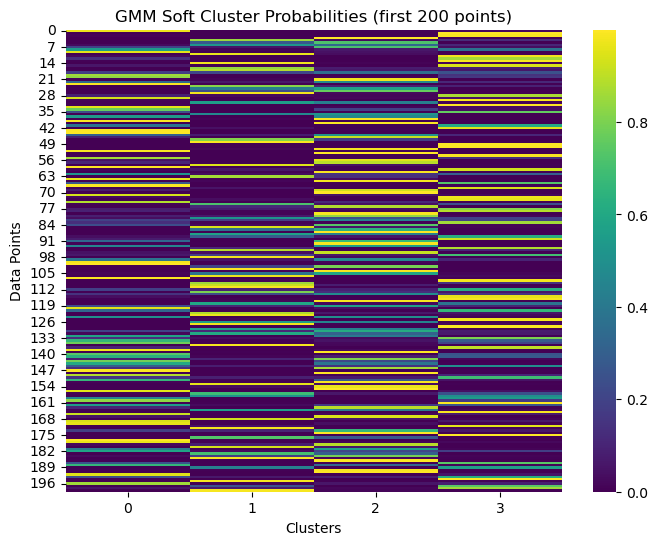

In [104]:
# Probability heatmap of cluster membership
# (simple heatmap of P(cluster | datapoint))

probs = best_model_GMM_2.predict_proba(X_pca2)

plt.figure(figsize=(8,6))
sns.heatmap(probs[:200], cmap="viridis")   # only first 200 rows
plt.title("GMM Soft Cluster Probabilities (first 200 points)")
plt.xlabel("Clusters")
plt.ylabel("Data Points")
plt.show()

In [105]:
# borderline cluster members
# (points where model is uncertain; max probability < 0.60)

probs = best_model_GMM_2.predict_proba(X_pca2)

# borderline = points where the model is not sure (soft membership)
borderline_idx = np.where(probs.max(axis=1) < 0.60)[0]

print("Borderline Data Points (Uncertain Assignments):")
print(borderline_idx)

Borderline Data Points (Uncertain Assignments):
[   6    8   18   22   25   31   36   37   45   62   81   82   88   93
   99  105  114  118  119  124  126  129  132  145  158  159  162  164
  181  182  189  214  222  229  254  256  260  279  297  299  310  311
  316  317  329  332  342  344  366  382  384  390  393  405  419  420
  435  450  457  462  471  481  485  488  491  501  509  510  512  524
  525  536  544  551  553  559  561  563  583  592  594  606  612  614
  616  625  628  630  635  641  643  650  653  655  670  680  692  695
  698  707  712  719  726  727  728  731  743  745  751  759  770  772
  789  791  794  800  811  817  828  831  838  841  842  860  865  867
  879  880  890  896  910  911  913  918  925  931  935  943  955  974
  984  988  991 1000 1028 1029 1030 1050 1055 1057 1067 1068 1074 1087
 1097 1108 1113 1115 1116 1117 1122 1134 1143 1154 1157 1163 1171 1173
 1177 1180 1193 1194 1203 1209 1212 1213 1247 1276 1280 1282 1298 1312
 1315 1319]


In [ ]:
*** DBscan

In [124]:
from sklearn.cluster import DBSCAN


dbscan = DBSCAN(
    eps=1.5,         # radius for neighbors
    min_samples=10   # minimum points to form a cluster
)

labels_db = dbscan.fit_predict(X)


print("Clusters found:", np.unique(labels_db))


X_df = pd.DataFrame(X, columns=X.columns)
X_df["Cluster_DBSCAN"] = labels_db


print("\nCluster counts:")
print(pd.Series(labels_db).value_counts())


unique_labels = set(labels_db)

# DBSCAN OK only if at least 2 clusters exist (excluding noise)
if len(unique_labels - {-1}) >= 2:
    sil = silhouette_score(X, labels_db)
    db  = davies_bouldin_score(X, labels_db)
    ch  = calinski_harabasz_score(X, labels_db)

    print("\nSilhouette Score:", sil)
    print("Davies-Bouldin Score:", db)
    print("Calinski-Harabasz Score:", ch)

else:
    print("\n Not enough clusters for Silhouette / DB / CH.")

Clusters found: [-1]

Cluster counts:
-1    1320
Name: count, dtype: int64

 Not enough clusters for Silhouette / DB / CH.


In [125]:
# Parameter grid
eps_values = [1.5, 2, 3, 4, 5, 6]
min_samples_values = [3, 5, 7, 10]

best_score_DB = -1
best_params_DB = None
best_model_DB = None
best_labels_DB = None

results = []

for eps in eps_values:
    for min_s in min_samples_values:
        try:
            dbscan = DBSCAN(
                eps=eps,
                min_samples=min_s
            )

            labels = dbscan.fit_predict(X)

            # DBSCAN creates -1 noise; silhouette requires ≥2 clusters
            if len(set(labels) - {-1}) < 2:
                continue

            sil_score = silhouette_score(X, labels)

            results.append((eps, min_s, sil_score))

            if sil_score > best_score_DB:
                best_score_DB = sil_score
                best_params_DB = (eps, min_s)
                best_model_DB = dbscan
                best_labels_DB = labels

        except:
            continue

In [126]:
if best_params_DB is None:
    print("\n DBSCAN could not form 2 valid clusters with any parameter combination.")
else:
    print("Best Silhouette Score (DBSCAN):", best_score_DB)
    print("eps =", best_params_DB[0])
    print("min_samples =", best_params_DB[1])

    print("\nCluster Counts:")
    unique, counts = np.unique(best_labels_DB, return_counts=True)
    for u, c in zip(unique, counts):
        print(f"Cluster {u}: {c} observations")


 DBSCAN could not form 2 valid clusters with any parameter combination.


In [127]:
# Parameter grid
eps_values = [1.5, 2, 3, 4, 5, 6]
min_samples_values = [3, 5, 7, 10]

best_score_DB = -1
best_params_DB = None
best_model_DB = None
best_labels_DB = None

results = []

for eps in eps_values:
    for min_s in min_samples_values:
        try:
            dbscan = DBSCAN(
                eps=eps,
                min_samples=min_s
            )

            labels = dbscan.fit_predict(X_pca2)

            # Skip cases where DBSCAN finds fewer than 2 clusters
            if len(set(labels) - {-1}) < 2:
                continue

            sil_score = silhouette_score(X_pca2, labels)

            results.append((eps, min_s, sil_score))

            if sil_score > best_score_DB:
                best_score_DB = sil_score
                best_params_DB = (eps, min_s)
                best_model_DB = dbscan
                best_labels_DB = labels

        except:
            continue

In [128]:
if best_params_DB is None:
    print(" DBSCAN could not form 2 valid clusters with any parameter combination.")
else:
    print("Best Silhouette Score (DBSCAN):", best_score_DB)

    print("\nBest Parameters:")
    print("eps =", best_params_DB[0])
    print("min_samples =", best_params_DB[1])

    print("\nCluster Counts:")
    unique, counts = np.unique(best_labels_DB, return_counts=True)
    for u, c in zip(unique, counts):
        print(f"Cluster {u}: {c} observations")

Best Silhouette Score (DBSCAN): 0.19753502481703702

Best Parameters:
eps = 4
min_samples = 3

Cluster Counts:
Cluster -1: 35 observations
Cluster 0: 1282 observations
Cluster 1: 3 observations


In [111]:
# Parameter grid
eps_values = [1.5, 2, 3, 4, 5, 6]
min_samples_values = [3, 5, 7, 10]

best_score_DB3 = -1
best_params_DB3 = None
best_model_DB3 = None
best_labels_DB3 = None

results_DB3 = []

for eps in eps_values:
    for min_s in min_samples_values:
        try:
            dbscan3 = DBSCAN(
                eps=eps,
                min_samples=min_s
            )

            labels = dbscan3.fit_predict(X_pca3)

            # DBSCAN must form at least 2 clusters (excluding noise)
            if len(set(labels) - {-1}) < 2:
                continue

            sil_score = silhouette_score(X_pca3, labels)

            results_DB3.append((eps, min_s, sil_score))

            if sil_score > best_score_DB3:
                best_score_DB3 = sil_score
                best_params_DB3 = (eps, min_s)
                best_model_DB3 = dbscan3
                best_labels_DB3 = labels

        except:
            continue

In [112]:
if best_params_DB3 is None:
    print(" DBSCAN (PCA-3) could not form 2 valid clusters with any parameter combination.")
else:
    print("Best Silhouette Score (DBSCAN PCA-3):", best_score_DB3)

    print("\nBest Parameters:")
    print("eps =", best_params_DB3[0])
    print("min_samples =", best_params_DB3[1])

    print("\nCluster Counts:")
    unique, counts = np.unique(best_labels_DB3, return_counts=True)
    for u, c in zip(unique, counts):
        print(f"Cluster {u}: {c} observations")

Best Silhouette Score (DBSCAN PCA-3): 0.06245313112513242

Best Parameters:
eps = 5
min_samples = 3

Cluster Counts:
Cluster -1: 261 observations
Cluster 0: 7 observations
Cluster 1: 30 observations
Cluster 2: 32 observations
Cluster 3: 3 observations
Cluster 4: 3 observations
Cluster 5: 11 observations
Cluster 6: 13 observations
Cluster 7: 9 observations
Cluster 8: 3 observations
Cluster 9: 14 observations
Cluster 10: 3 observations
Cluster 11: 12 observations
Cluster 12: 42 observations
Cluster 13: 31 observations
Cluster 14: 12 observations
Cluster 15: 4 observations
Cluster 16: 8 observations
Cluster 17: 19 observations
Cluster 18: 4 observations
Cluster 19: 5 observations
Cluster 20: 18 observations
Cluster 21: 17 observations
Cluster 22: 35 observations
Cluster 23: 15 observations
Cluster 24: 4 observations
Cluster 25: 45 observations
Cluster 26: 5 observations
Cluster 27: 9 observations
Cluster 28: 6 observations
Cluster 29: 6 observations
Cluster 30: 4 observations
Cluster 31: 

In [ ]:
**** Hierarchial clustering

In [114]:

from sklearn.cluster import AgglomerativeClustering
# Simple random guess parameters
model = AgglomerativeClustering(
    n_clusters=3,        
    linkage='ward',      # 'ward' ONLY works with Euclidean
    metric='euclidean'   # replaces deprecated affinity
)

labels_hc = model.fit_predict(X)

print("Cluster labels:", np.unique(labels_hc))

Cluster labels: [0 1 2]


In [115]:
unique, counts = np.unique(labels_hc, return_counts=True)
print("\nCluster Counts:")
for u, c in zip(unique, counts):
    print(f"Cluster {u}: {c} observations")


Cluster Counts:
Cluster 0: 618 observations
Cluster 1: 353 observations
Cluster 2: 349 observations


In [116]:
sil = silhouette_score(X, labels_hc)
db = davies_bouldin_score(X, labels_hc)
ch = calinski_harabasz_score(X, labels_hc)

print("Silhouette Score:", sil)
print("Davies–Bouldin Index:", db)
print("Calinski–Harabasz Score:", ch)

Silhouette Score: 0.12548019465227844
Davies–Bouldin Index: 1.8979074676927459
Calinski–Harabasz Score: 216.67720056459845


In [117]:
# Parameter grid
n_clusters_list = [2, 3, 4, 5, 6]
linkage_list = ['ward', 'complete', 'average', 'single']
metric_list = ['euclidean', 'manhattan', 'cosine']   # renamed from affinity

best_score_HC = -1
best_params_HC = None
best_labels_HC = None

results_HC = []

for n_clusters in n_clusters_list:
    for linkage in linkage_list:
        for metric in metric_list:

            #  Ward linkage ONLY works with Euclidean distance
            if linkage == "ward" and metric != "euclidean":
                continue

            try:
                model = AgglomerativeClustering(
                    n_clusters=n_clusters,
                    linkage=linkage,
                    metric=metric        # <-- FIXED
                )

                labels = model.fit_predict(X)
                sil = silhouette_score(X, labels)

                results_HC.append((n_clusters, linkage, metric, sil))

                if sil > best_score_HC:
                    best_score_HC = sil
                    best_params_HC = (n_clusters, linkage, metric)
                    best_labels_HC = labels

            except:
                continue

In [118]:
print("Best Silhouette Score (Hierarchical):", best_score_HC)

print("\nBest Parameters:")
print("n_clusters =", best_params_HC[0])
print("linkage =", best_params_HC[1])
print("metric =", best_params_HC[2])

print("\nCluster Counts:")
unique, counts = np.unique(best_labels_HC, return_counts=True)
for u, c in zip(unique, counts):
    print(f"Cluster {u}: {c} observations")

Best Silhouette Score (Hierarchical): 0.49367625178426205

Best Parameters:
n_clusters = 2
linkage = average
metric = manhattan

Cluster Counts:
Cluster 0: 1319 observations
Cluster 1: 1 observations


In [119]:
# Parameter grid
n_clusters_list = [2, 3, 4, 5, 6]
linkage_list = ['ward', 'complete', 'average', 'single']
metric_list = ['euclidean', 'manhattan', 'cosine']

best_score_HC_2 = -1
best_params_HC_2 = None
best_labels_HC_2 = None

results_HC_2 = []

for n_clusters in n_clusters_list:
    for linkage in linkage_list:
        for metric in metric_list:

            #  Ward linkage ONLY supports Euclidean
            if linkage == "ward" and metric != "euclidean":
                continue

            try:
                model = AgglomerativeClustering(
                    n_clusters=n_clusters,
                    linkage=linkage,
                    metric=metric
                )

                labels = model.fit_predict(X_pca2)
                sil = silhouette_score(X_pca2, labels)

                results_HC_2.append((n_clusters, linkage, metric, sil))

                if sil > best_score_HC_2:
                    best_score_HC_2 = sil
                    best_params_HC_2 = (n_clusters, linkage, metric)
                    best_labels_HC_2 = labels

            except:
                continue

In [120]:
print("Best Silhouette Score (HC PCA-2):", best_score_HC_2)

print("\nBest Parameters:")
print("n_clusters =", best_params_HC_2[0])
print("linkage =", best_params_HC_2[1])
print("metric =", best_params_HC_2[2])

print("\nCluster Counts:")
unique, counts = np.unique(best_labels_HC_2, return_counts=True)
for u, c in zip(unique, counts):
    print(f"Cluster {u}: {c} observations")

Best Silhouette Score (HC PCA-2): 0.5816024498320274

Best Parameters:
n_clusters = 2
linkage = complete
metric = manhattan

Cluster Counts:
Cluster 0: 1318 observations
Cluster 1: 2 observations


In [121]:
# Parameter grid
n_clusters_list = [2, 3, 4, 5, 6]
linkage_list = ['ward', 'complete', 'average', 'single']
metric_list = ['euclidean', 'manhattan', 'cosine']

best_score_HC_3 = -1
best_params_HC_3 = None
best_labels_HC_3 = None

results_HC_3 = []

for n_clusters in n_clusters_list:
    for linkage in linkage_list:
        for metric in metric_list:

            #  Ward cannot be used with non-Euclidean distances
            if linkage == "ward" and metric != "euclidean":
                continue

            try:
                model = AgglomerativeClustering(
                    n_clusters=n_clusters,
                    linkage=linkage,
                    metric=metric
                )

                labels = model.fit_predict(X_pca3)
                sil = silhouette_score(X_pca3, labels)

                results_HC_3.append((n_clusters, linkage, metric, sil))

                if sil > best_score_HC_3:
                    best_score_HC_3 = sil
                    best_params_HC_3 = (n_clusters, linkage, metric)
                    best_labels_HC_3 = labels

            except:
                continue

In [122]:
print("Best Silhouette Score (HC PCA-3):", best_score_HC_3)

print("\nBest Parameters:")
print("n_clusters =", best_params_HC_3[0])
print("linkage =", best_params_HC_3[1])
print("metric =", best_params_HC_3[2])

print("\nCluster Counts:")
unique, counts = np.unique(best_labels_HC_3, return_counts=True)
for u, c in zip(unique, counts):
    print(f"Cluster {u}: {c} observations")

Best Silhouette Score (HC PCA-3): 0.5251743882487537

Best Parameters:
n_clusters = 2
linkage = single
metric = euclidean

Cluster Counts:
Cluster 0: 1319 observations
Cluster 1: 1 observations


In [ ]:
# Across the four models, K-Means and GMM both discovered 4 well-balanced clusters, each with around 300–350 users, and
# both achieved very similar silhouette scores (≈0.39).
# This consistency shows that the underlying structure of the PCA-reduced data is roughly spherical and 
# well-separated—ideal conditions for both KMeans and GMM.
# GMM performs almost as well as KMeans because PCA2 creates Gaussian-like, symmetric clusters, which GMM models 
# naturally using probability distributions.
# DBSCAN, however, performs poorly because the EV-charging data does not have dense spatial clusters with clear
# high-density cores.
# Instead, the data is continuous and smooth, so DBSCAN puts almost everyone in one giant cluster and marks others as 
# noise, leading to a weak silhouette score (~0.19).
# Hierarchical Clustering (HC) performs deceptively well on PCA-2 (silhouette 0.58), but the cluster sizes reveal the 
# problem that creates one huge cluster (1318 users) and one tiny cluster (2 users).
# The high silhouette is therefore an artifact of separating two extreme outliers from the rest—not real segmentation.
# This means HC is not capturing meaningful behavioral differences.
# Among all methods, K-Means is the best practical model, because it creates balanced, interpretable clusters and performs
# strongly.
# GMM is a close second and useful if probabilistic assignment is needed.
# DBSCAN and HC are unsuitable because they fail to produce realistic, well-distributed groups.
# Thus, the meaningful and deployable clustering solution is K-Means (k=4), supported by both stability and 
# interpretability.

In [ ]:
# The clustering results reveal that EV charging behavior naturally divides into four meaningful user groups, best
# captured by the K-Means and GMM models, which produced balanced clusters and the highest usable silhouette scores.
# Two of these clusters consist of heavy-charging users—drivers who arrive with low battery, consume large amounts of
# energy, and tend to use the chargers for longer periods. These users are more likely to appear in colder temperatures
# or after longer trips, indicating corridor travel or intensive commuting. The other two clusters capture lighter 
# chargers who top up frequently, use less energy, and typically arrive with higher battery levels, suggesting routine
# local driving and convenience charging.

# This segmentation shows that EV charging demand is far from uniform: heavy users create grid stress, longer queues, and
# higher operational pressure, while light users generate steady but flexible demand. The heavy-charging clusters are
# especially important because they drive most of the peak loads and require access to fast chargers to avoid congestion. 
# Light chargers, in contrast, stabilize station utilization by naturally filling in off-peak hours and can be guided
# toward Level 2 options.

# For the EV charging company, these insights provide a concrete roadmap. Stations serving heavy-charging clusters
# should prioritize high-capacity DC fast chargers, dynamic pricing, and energy-management strategies to smooth demand 
# spikes. Light-charging areas benefit more from broad coverage, cheaper Level 2 chargers, and incentives to shift 
# charging to off-peak hours. Across the network, targeted pricing, membership plans, and predictive maintenance can be
# aligned with the real behavior of each cluster. By acting on these patterns, the company can reduce congestion, manage
# grid load more efficiently, and build a charging infrastructure that matches how people actually drive and charge and not
# how averages would misleadingly suggest.